In [1]:
import pandas as pd

In [2]:
data = pd.read_excel("Dataset Molecules.xlsx")

In [3]:
data.head()

,Title,r_j_SCF_Energy_Hartree,r_j_Gas_Phase_Energy_Hartree,r_j_One_Electron_Energy_Hartree,r_j_Two-electron_Energy_Hartree,r_j_Total_Electronic_Energy_Hartree,r_j_Nuclear_Repulsion_Energy_Hartree,r_j_Alpha_HOMO_Energy_Hartree,r_j_Beta_HOMO_Energy_Hartree,r_j_Alpha_LUMO_Energy_Hartree,...,r_qp_PSA,i_qp_#NandO,i_qp_RuleOfFive,i_qp_RuleOfThree,i_qp_#ringatoms,i_qp_#in34,i_qp_#in56,i_qp_#noncon,i_qp_#nonHatm,Efficiency in %
0,H02,-1395.789982,-1395.789982,-5537.804765,2304.658445,-3233.146320,1837.356339,-0.35752,-0.35752,-0.23291,...,63.487,4.0,0.0,0.0,16.0,0.0,16.0,0.0,22.0,90.9
1,H04,-627.580604,-627.580604,-2540.406663,1045.890545,-1494.516117,866.935513,-0.48196,-0.48196,-0.35147,...,76.566,4.0,0.0,1.0,10.0,0.0,10.0,0.0,14.0,97.0
2,H06,-3243.714819,-3243.714819,-7289.359661,2629.229928,-4660.129733,1416.414914,-0.36937,-0.36937,-0.24014,...,38.938,3.0,0.0,0.0,10.0,0.0,10.0,0.0,16.0,96.1
3,H08,-3283.021505,-3283.021505,-7379.091406,2660.721750,-4718.369656,1435.348151,-0.34723,-0.34723,-0.24110,...,37.621,3.0,0.0,0.0,10.0,0.0,10.0,0.0,17.0,96.6
4,H09,-3778.432635,-3778.432635,-11384.012430,4478.274689,-6905.737743,3127.305107,-0.42391,-0.42391,-0.32968,...,45.805,4.0,1.0,1.0,25.0,0.0,25.0,0.0,30.0,97.0


In [4]:
for i in data.columns :
    print(i)

Title
r_j_SCF_Energy_Hartree
r_j_Gas_Phase_Energy_Hartree
r_j_One_Electron_Energy_Hartree
r_j_Two-electron_Energy_Hartree
r_j_Total_Electronic_Energy_Hartree
r_j_Nuclear_Repulsion_Energy_Hartree
r_j_Alpha_HOMO_Energy_Hartree
r_j_Beta_HOMO_Energy_Hartree
r_j_Alpha_LUMO_Energy_Hartree
r_j_Beta_LUMO_Energy_Hartree
i_j_Number_of_canonical_orbitals
r_j_Min_Elem_Overlap_Matrix
r_j_Dipole_Moment_Magnitude_(qm)_Debye
r_j_Dipole_Component_X_(qm)_Debye
r_j_Dipole_Component_Y_(qm)_Debye
r_j_Dipole_Component_Z_(qm)_Debye
r_j_Dipole_Moment_Magnitude_(esp)_Debye
r_j_Dipole_Component_X_(esp)_Debye
r_j_Dipole_Component_Y_(esp)_Debye
r_j_Dipole_Component_Z_(esp)_Debye
r_j_s2_Spin
r_j_sz2_Spin
r_j_Rotational_constants_of_molecule_0
r_j_Rotational_constants_of_molecule_1
r_j_Rotational_constants_of_molecule_2
i_j_symmetry_number_for_molecule
r_j_HOMO-LUMO_Gap_Hartree
r_canvas_AlogP
r_canvas_Estate
i_canvas_HBA
i_canvas_HBD
r_canvas_MR
r_canvas_MW
r_canvas_Polar
r_canvas_PSA
i_canvas_RB
i_canvas_HeavyAtom

In [5]:
# Keeping the first and last columns ("Title" and "Efficiency in %")
title_column = 'Title'
efficiency_column = 'Efficiency in %'

In [6]:
# Grouping the data into the required categories
# 1. Jaguar (Quantum descriptors via DFT)
jaguar_columns = [col for col in data.columns if 'j_' in col]  # Assuming columns related to Jaguar start with 'j_'

In [7]:
# Defining columns starting with 'r_canvas', 'i_canvas', or 'b_canvas' as pharmacological descriptors (Canvas - Green)
pharmacological_columns = [col for col in data.columns if col.startswith('r_canvas') or col.startswith('i_canvas') or col.startswith('b_canvas')]

In [8]:
# 3. Topological descriptors
topological_columns = [col for col in data.columns if 'Desc' in col or 'topo' in col]  # Assuming 'Desc' refers to topological descriptors

In [9]:
# 4. MOPAC Quantum descriptors
mopac_quantum_columns = [col for col in data.columns if 'MOPAC' in col or 'q_' in col]  # Assuming 'MOPAC' or 'q_' refers to quantum descriptors

In [10]:
# 5. MOPAC Physico-chemical descriptors
physico_chemical_columns = [col for col in data.columns if 'physico' in col or 'i_qp' in col]  # Physico-chemical properties

In [11]:
# Creating separate datasets for each category
jaguar_data = data[[title_column] + jaguar_columns + [efficiency_column]]
pharmacological_data = data[[title_column] + pharmacological_columns + [efficiency_column]]
topological_data = data[[title_column] + topological_columns + [efficiency_column]]
mopac_quantum_data = data[[title_column] + mopac_quantum_columns + [efficiency_column]]
physico_chemical_data = data[[title_column] + physico_chemical_columns + [efficiency_column]]

In [12]:
jaguar_data.isnull().head()

,Title,r_j_SCF_Energy_Hartree,r_j_Gas_Phase_Energy_Hartree,r_j_One_Electron_Energy_Hartree,r_j_Two-electron_Energy_Hartree,r_j_Total_Electronic_Energy_Hartree,r_j_Nuclear_Repulsion_Energy_Hartree,r_j_Alpha_HOMO_Energy_Hartree,r_j_Beta_HOMO_Energy_Hartree,r_j_Alpha_LUMO_Energy_Hartree,...,r_j_Dipole_Component_Y_(esp)_Debye,r_j_Dipole_Component_Z_(esp)_Debye,r_j_s2_Spin,r_j_sz2_Spin,r_j_Rotational_constants_of_molecule_0,r_j_Rotational_constants_of_molecule_1,r_j_Rotational_constants_of_molecule_2,i_j_symmetry_number_for_molecule,r_j_HOMO-LUMO_Gap_Hartree,Efficiency in %
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [13]:
pharmacological_data.head()

,Title,r_canvas_AlogP,r_canvas_Estate,i_canvas_HBA,i_canvas_HBD,r_canvas_MR,r_canvas_MW,r_canvas_Polar,r_canvas_PSA,i_canvas_RB,...,r_canvas_sSnH3_Avg,r_canvas_ssSnH2_Avg,r_canvas_sssSnH_Avg,r_canvas_ssssSn_Avg,r_canvas_sI_Avg,r_canvas_sPbH3_Avg,r_canvas_ssPbH2_Avg,r_canvas_sssPbH_Avg,r_canvas_ssssPb_Avg,Efficiency in %
0,H02,3.6835,54.447,3,2,83.9419,314.74302,41.114,60.67,3,...,0,0,0,0,0,0,0,0,0,90.9
1,H04,-0.6740,32.168,1,4,52.4247,191.22972,26.751,74.04,2,...,0,0,0,0,0,0,0,0,0,97.0
2,H06,2.2590,35.918,2,2,66.3673,283.14112,30.595,43.60,4,...,0,0,0,0,0,0,0,0,0,96.1
3,H08,2.3214,37.418,2,2,71.2327,297.16770,32.430,43.60,5,...,0,0,0,0,0,0,0,0,0,96.6
4,H09,6.4473,61.587,1,3,122.8276,460.36568,60.149,53.44,3,...,0,0,0,0,0,0,0,0,0,97.0


In [14]:
topological_data.head()

,Title,r_desc_Molecular_electrotopological_variation,r_desc_Maximal_electrotopological_positive_variation,r_desc_Maximal_electrotopological_negative_variation,r_desc_Mean_topological_charge_index_of_order_1,r_desc_Mean_topological_charge_index_of_order_2,r_desc_Mean_topological_charge_index_of_order_3,r_desc_Mean_topological_charge_index_of_order_4,r_desc_Mean_topological_charge_index_of_order_5,r_desc_Mean_topological_charge_index_of_order_6,...,i_desc_Sum_of_topological_distances_between_F..Br,i_desc_Sum_of_topological_distances_between_F..I,i_desc_Sum_of_topological_distances_between_Cl..Cl,i_desc_Sum_of_topological_distances_between_Cl..Br,i_desc_Sum_of_topological_distances_between_Cl..I,i_desc_Sum_of_topological_distances_between_Br..Br,i_desc_Sum_of_topological_distances_between_Br..I,i_desc_Sum_of_topological_distances_between_I..I,r_desc_E-state_topological_parameter,Efficiency in %
0,H02,25.582224,4.999394,2.103887,0.166667,0.091503,0.047697,0.041111,0.028595,0.020272,...,0,0,0,0,0,0,0,0,38.527502,90.9
1,H04,10.107730,3.596591,1.394989,0.133333,0.088889,0.047619,0.041569,0.027146,0.028245,...,0,0,0,0,0,0,0,0,16.481715,97.0
2,H06,13.520576,3.687676,1.402925,0.117647,0.080808,0.043478,0.037193,0.021329,0.016163,...,0,0,0,0,0,0,0,0,21.462480,96.1
3,H08,13.949308,3.727035,1.398326,0.111111,0.077295,0.041667,0.035333,0.019907,0.014694,...,0,0,0,0,0,0,0,0,24.337706,96.6
4,H09,16.708056,4.270346,1.404742,0.176471,0.084444,0.045073,0.042943,0.025875,0.017418,...,0,0,0,0,0,0,0,0,38.899865,97.0


In [15]:
mopac_quantum_data.head()

,Title,r_mopac_MOPAC_Heat_of_Formation,r_mopac_MOPAC_Total_Energy_EV,Efficiency in %
0,H02,106.346291,-3889.5707,90.9
1,H04,415.946537,-2382.3569,97.0
2,H06,117.951678,-2909.2720,96.1
3,H08,110.759803,-3065.1217,96.6
4,H09,450.795257,-4780.6159,97.0


In [16]:
physico_chemical_data.head()

,Title,i_qp_#stars,i_qp_#amine,i_qp_#amidine,i_qp_#acid,i_qp_#amide,i_qp_#rotor,i_qp_#rtvFG,i_qp_CNS,i_qp_#metab,i_qp_HumanOralAbsorption,i_qp_#NandO,i_qp_RuleOfFive,i_qp_RuleOfThree,i_qp_#ringatoms,i_qp_#in34,i_qp_#in56,i_qp_#noncon,i_qp_#nonHatm,Efficiency in %
0,H02,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,2.0,3.0,4.0,0.0,0.0,16.0,0.0,16.0,0.0,22.0,90.9
1,H04,1.0,2.0,0.0,0.0,0.0,4.0,1.0,-1.0,3.0,2.0,4.0,0.0,1.0,10.0,0.0,10.0,0.0,14.0,97.0
2,H06,0.0,0.0,0.0,0.0,0.0,5.0,1.0,0.0,4.0,3.0,3.0,0.0,0.0,10.0,0.0,10.0,0.0,16.0,96.1
3,H08,0.0,0.0,0.0,0.0,0.0,6.0,1.0,0.0,4.0,3.0,3.0,0.0,0.0,10.0,0.0,10.0,0.0,17.0,96.6
4,H09,1.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,5.0,1.0,4.0,1.0,1.0,25.0,0.0,25.0,0.0,30.0,97.0


## Handle missing values

In [13]:
physico_chemical_data.isnull().sum().sum()

18

In [14]:
physico_chemical_data = physico_chemical_data.dropna()

## Check for outliers

In [15]:
import matplotlib.pyplot as plt

### 1- physico_chemical_data

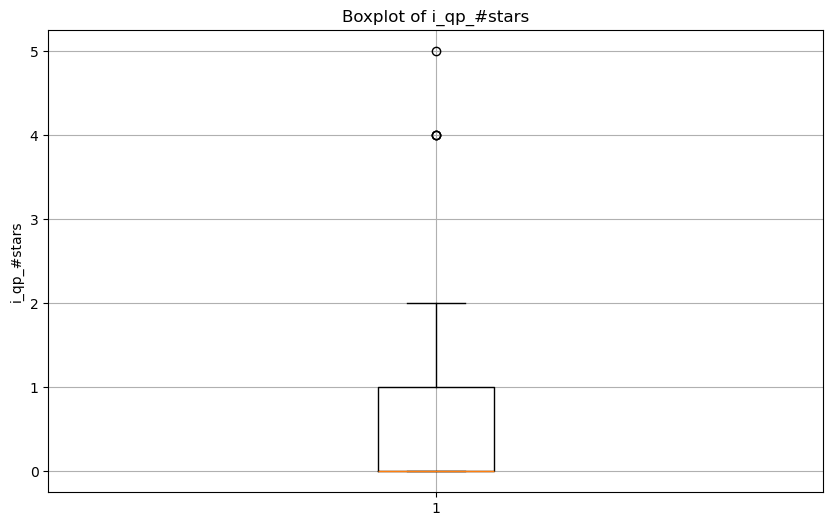

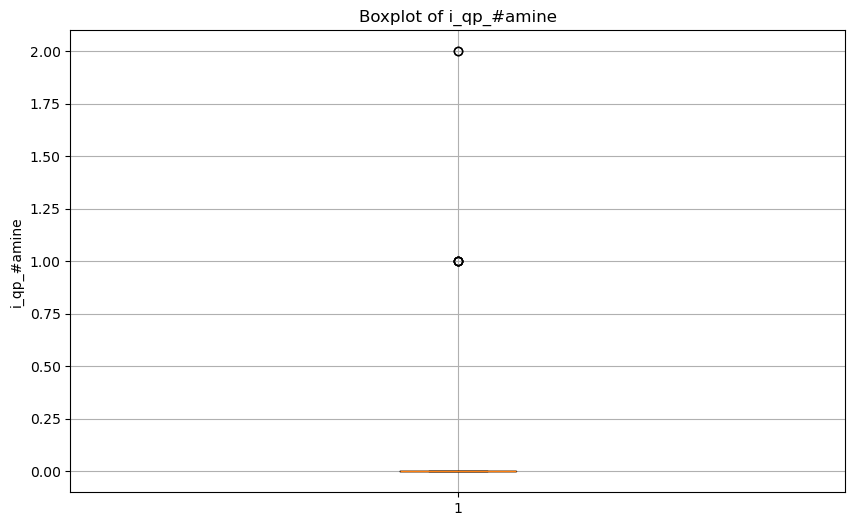

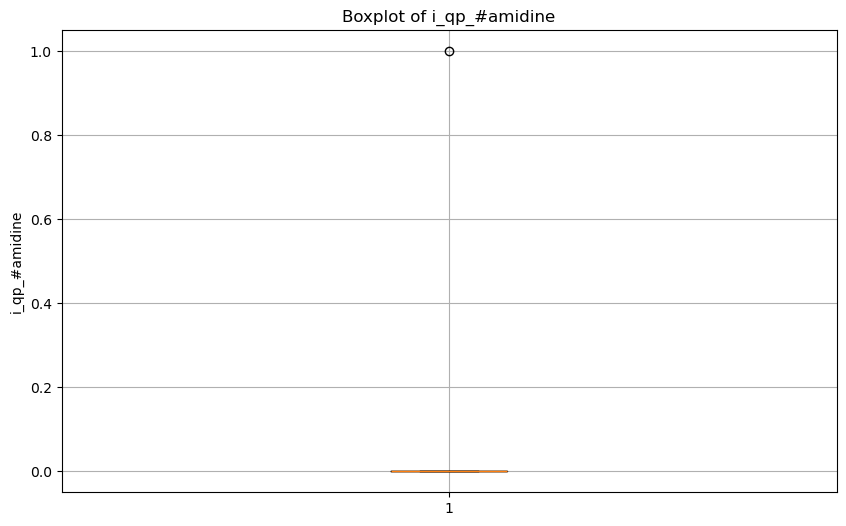

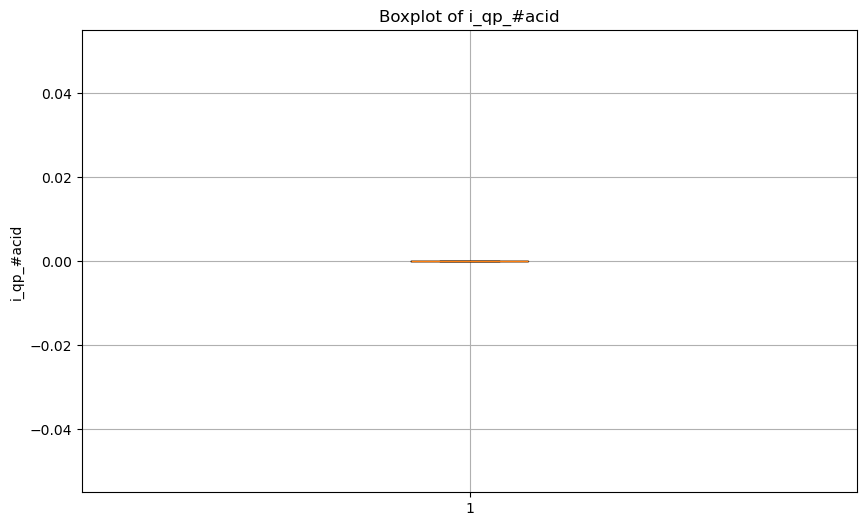

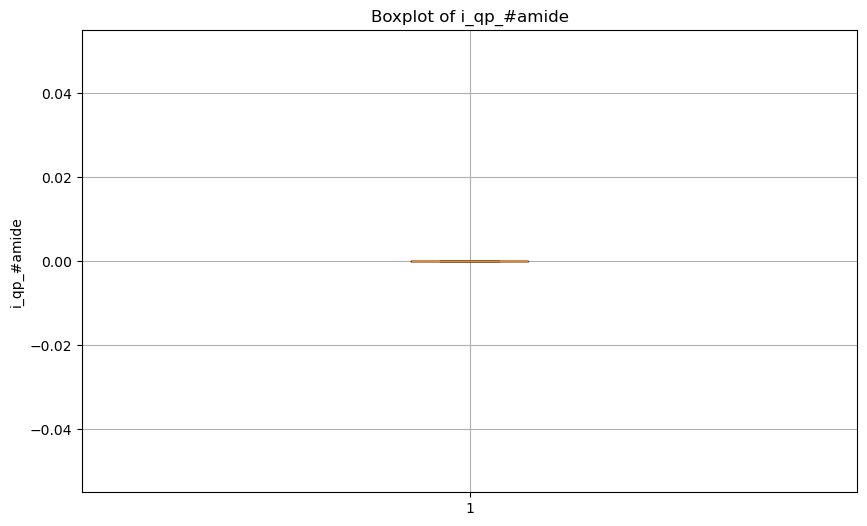

...

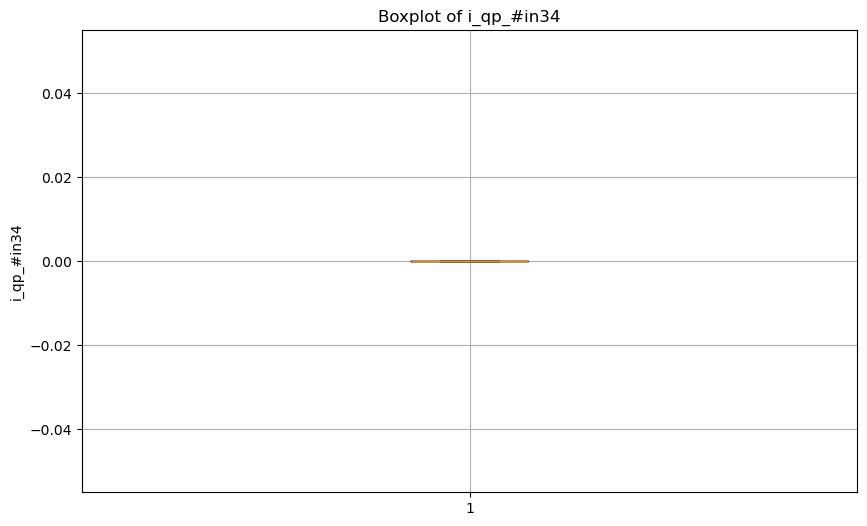

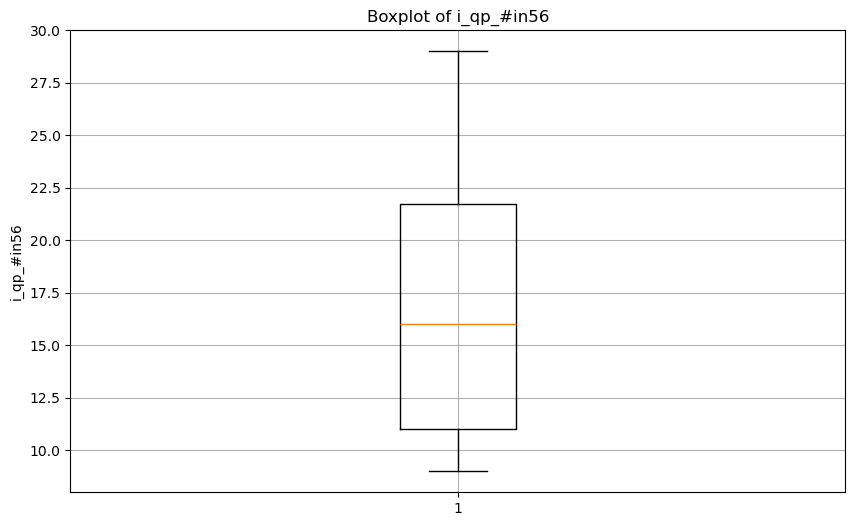

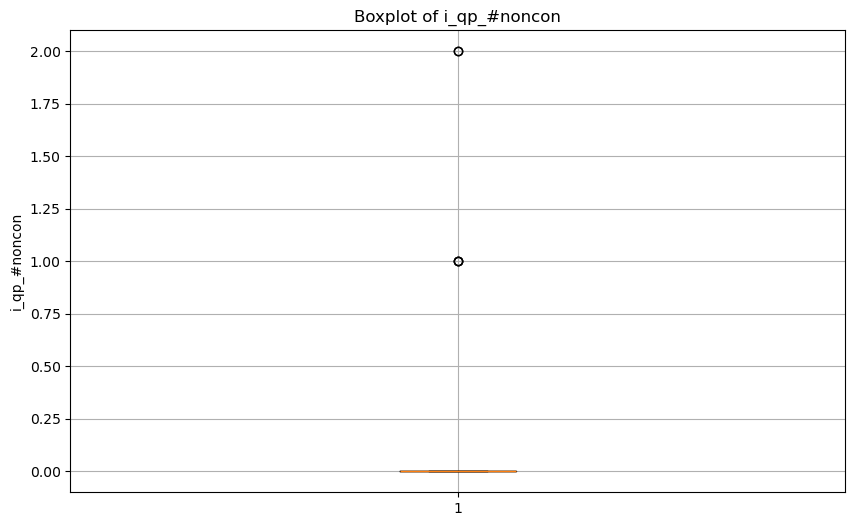

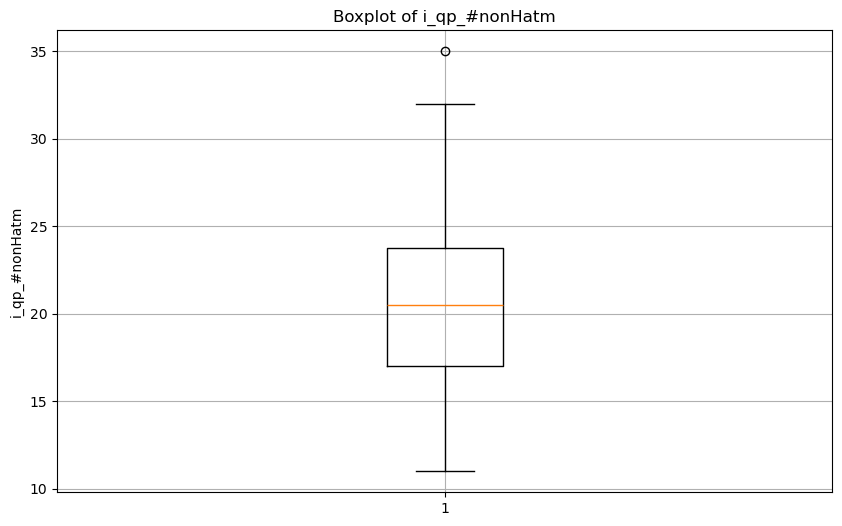

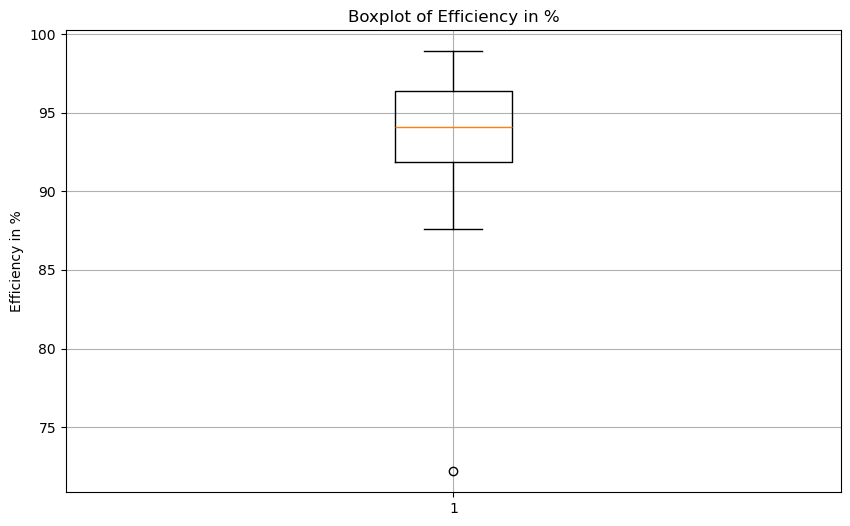

In [16]:
# Selecting only numeric columns for the boxplot
numeric_columns = physico_chemical_data.select_dtypes(include='number').columns

# Creating boxplots for each numeric column to visualize outliers
for col in numeric_columns:
    plt.figure(figsize=(10, 6))
    plt.boxplot(physico_chemical_data[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

### 2- Jaguar_Data

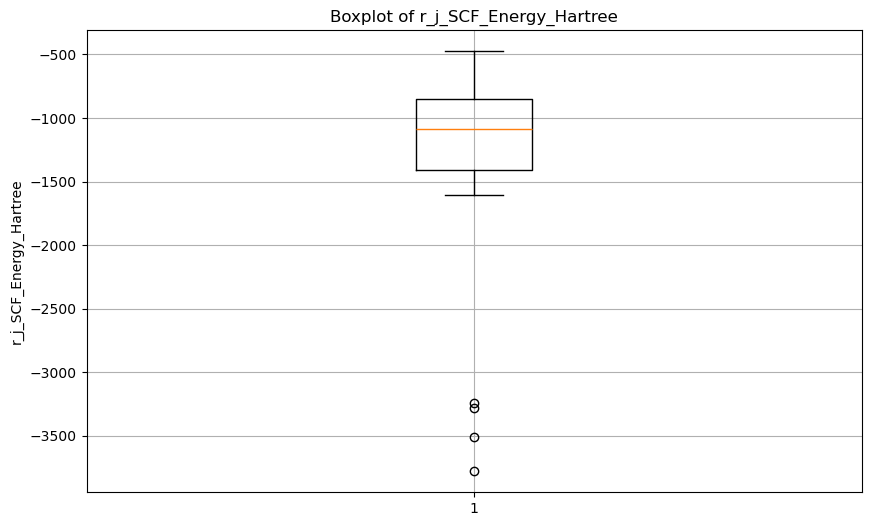

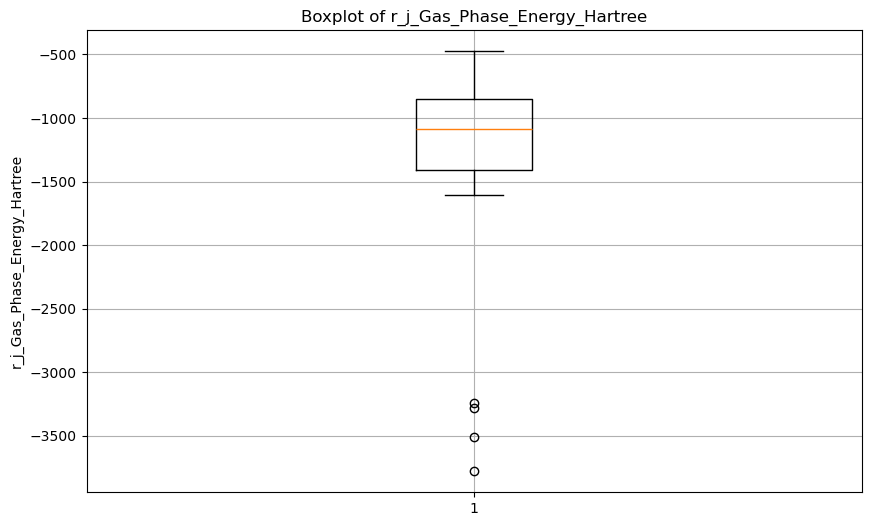

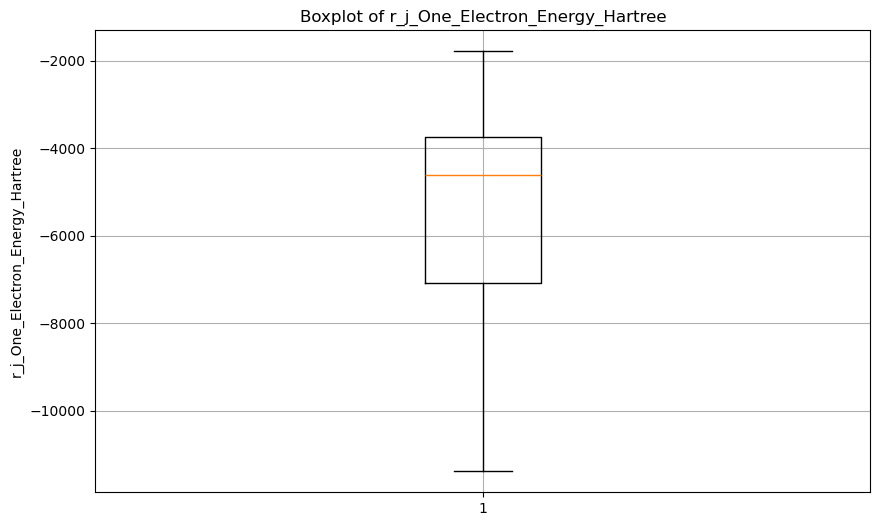

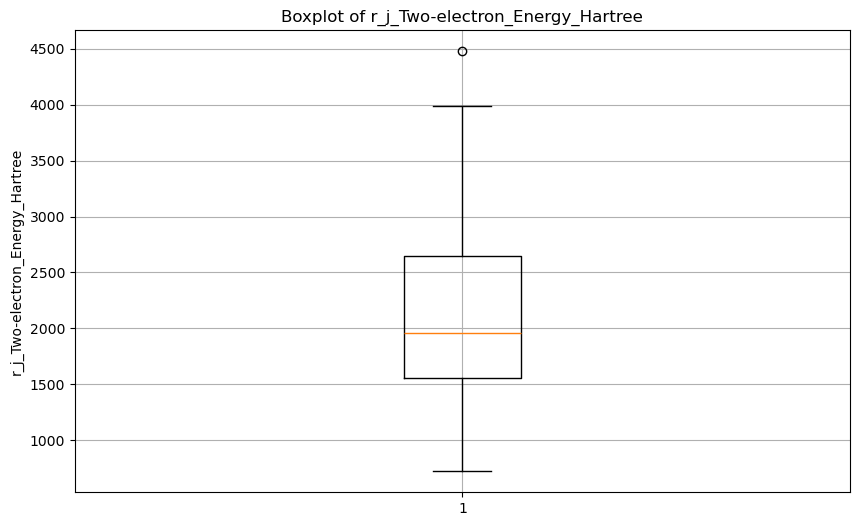

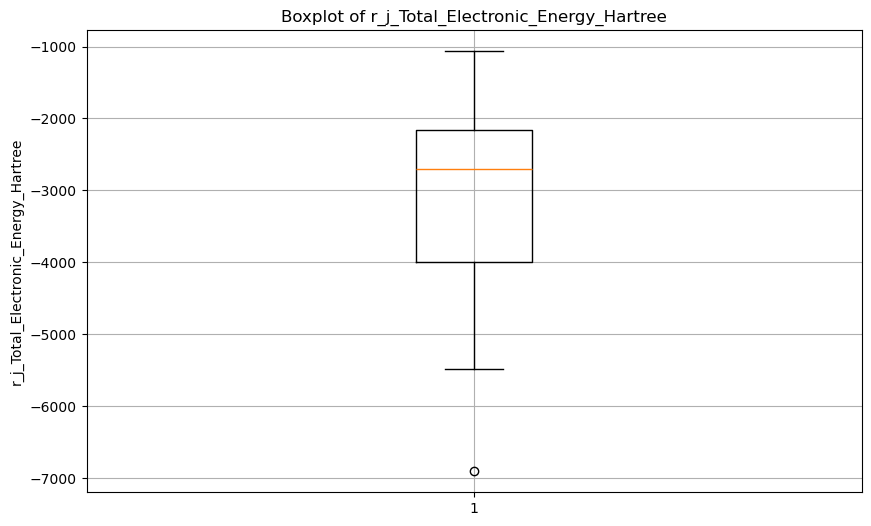

...

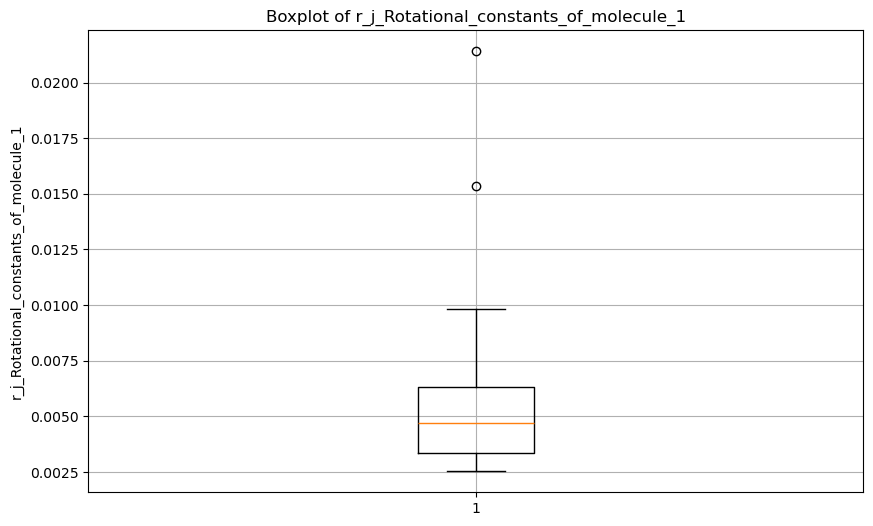

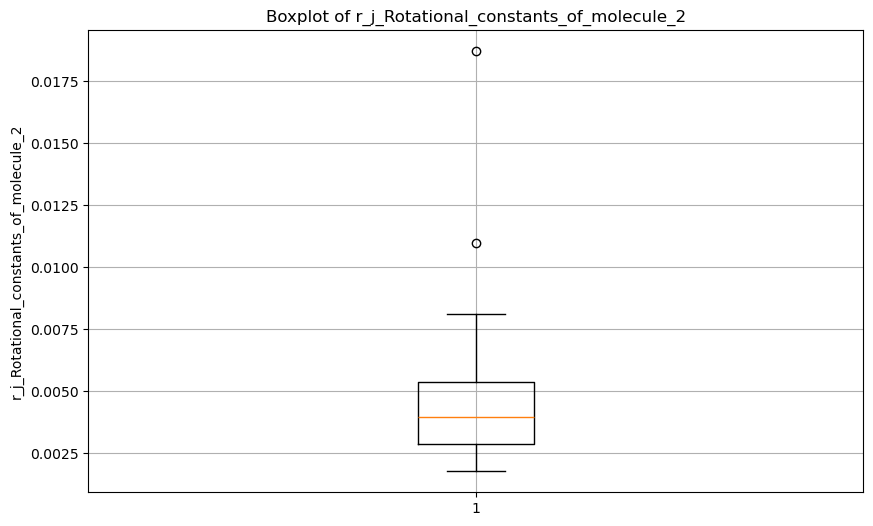

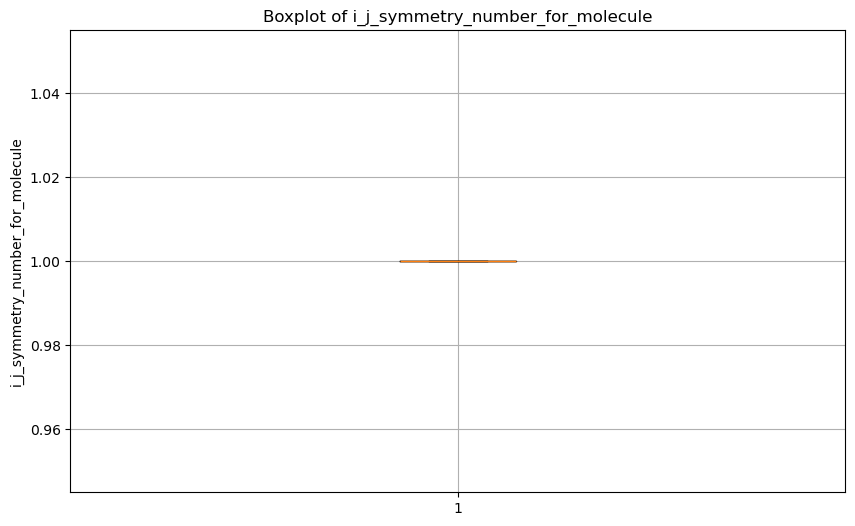

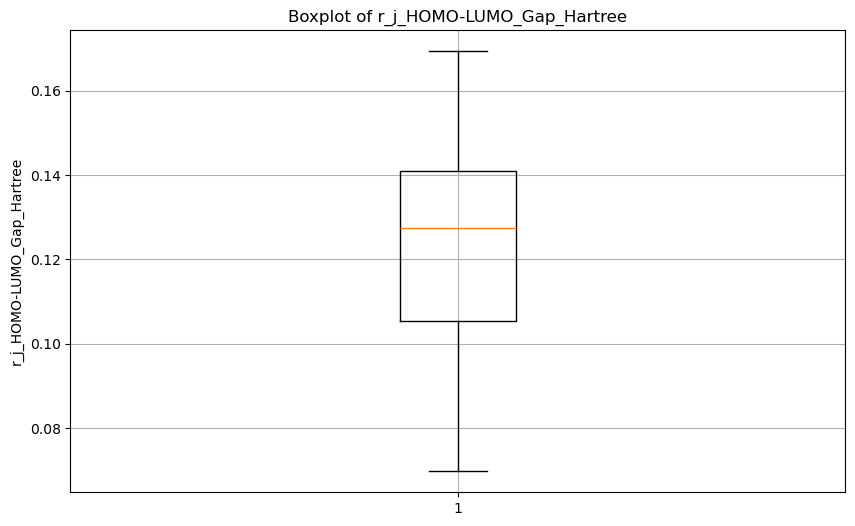

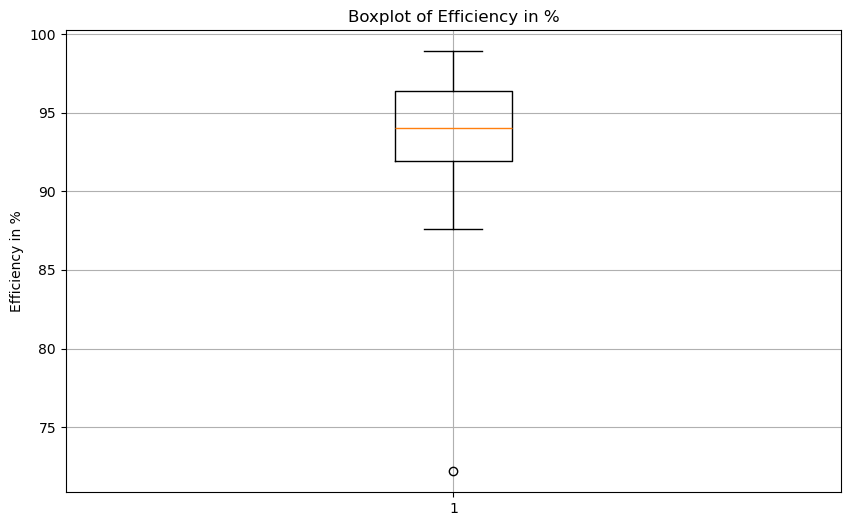

In [21]:
# Selecting only numeric columns for the boxplot
numeric_columns = jaguar_data.select_dtypes(include='number').columns

# Creating boxplots for each numeric column to visualize outliers
for col in numeric_columns:
    plt.figure(figsize=(10, 6))
    plt.boxplot(jaguar_data[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

### 3-pharmacological_data

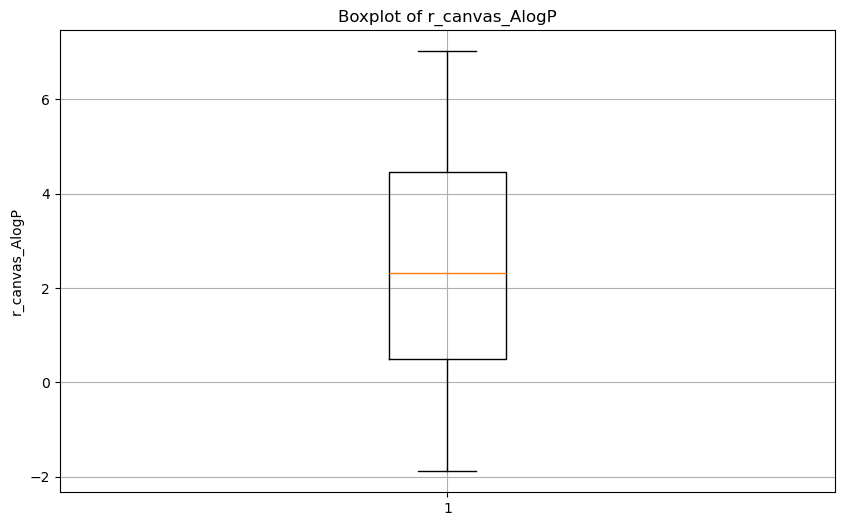

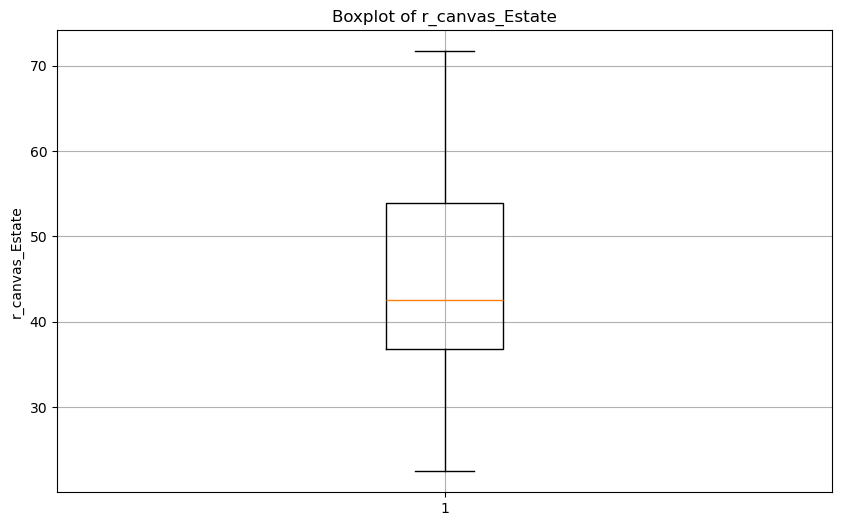

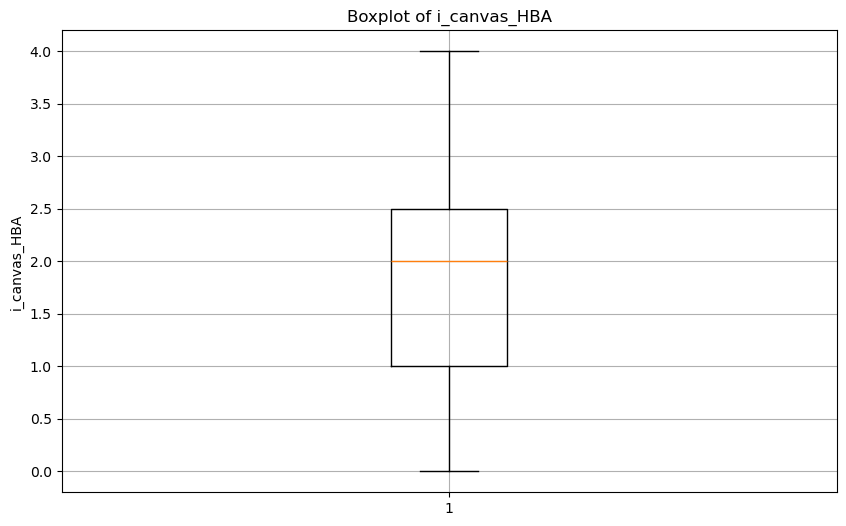

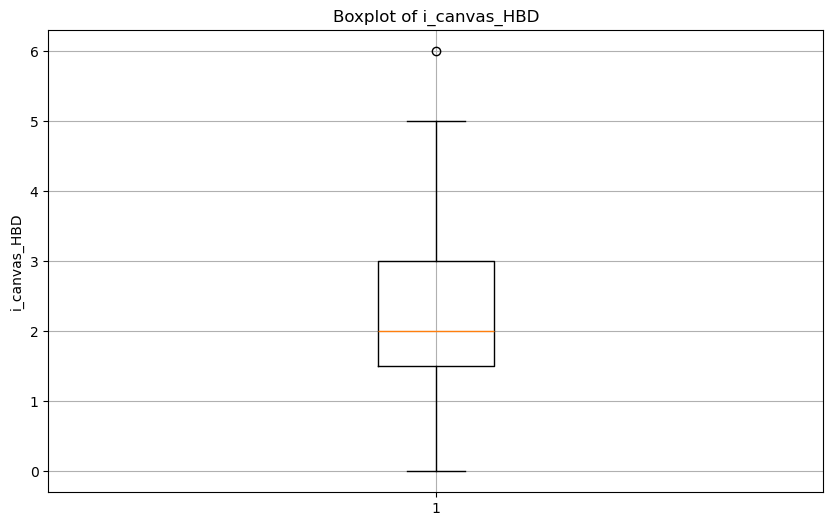

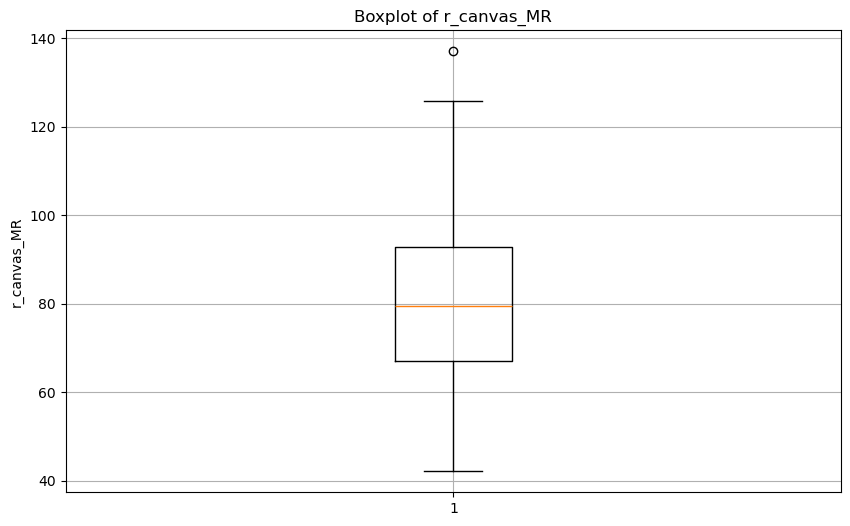

...

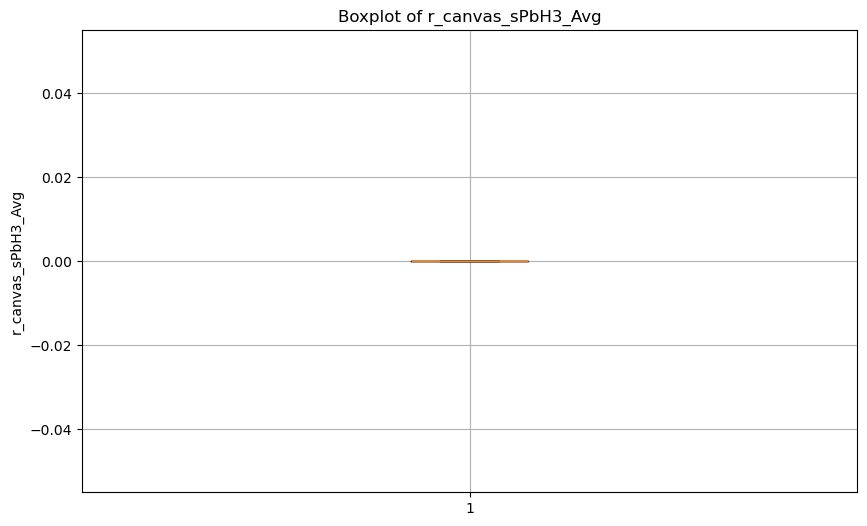

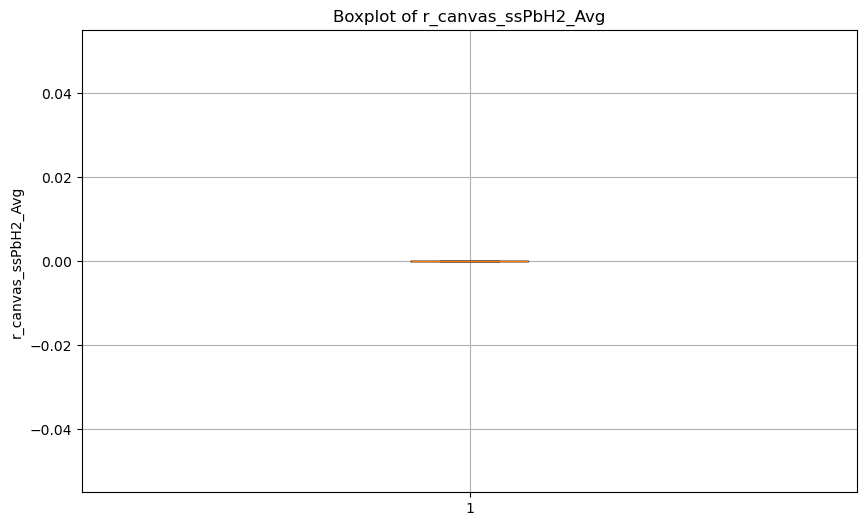

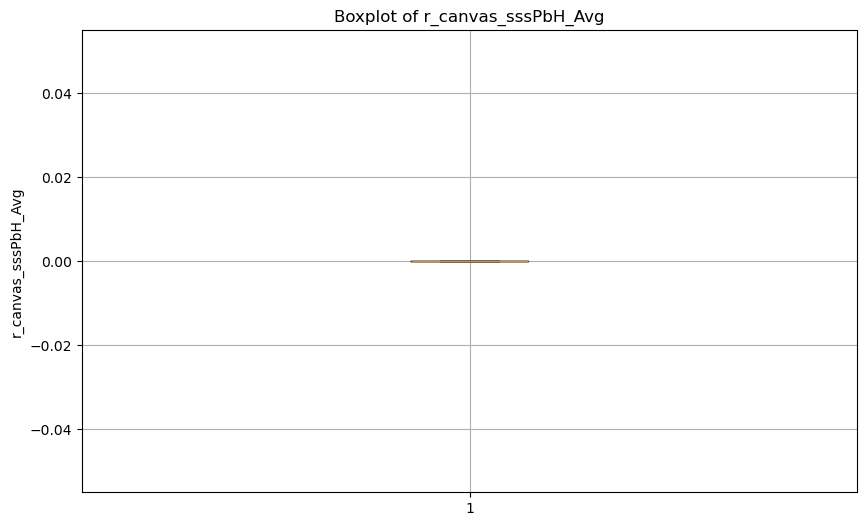

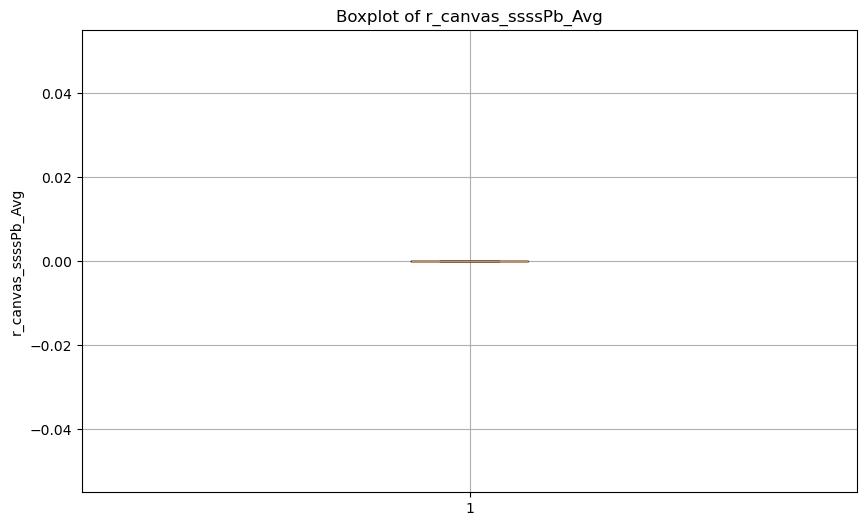

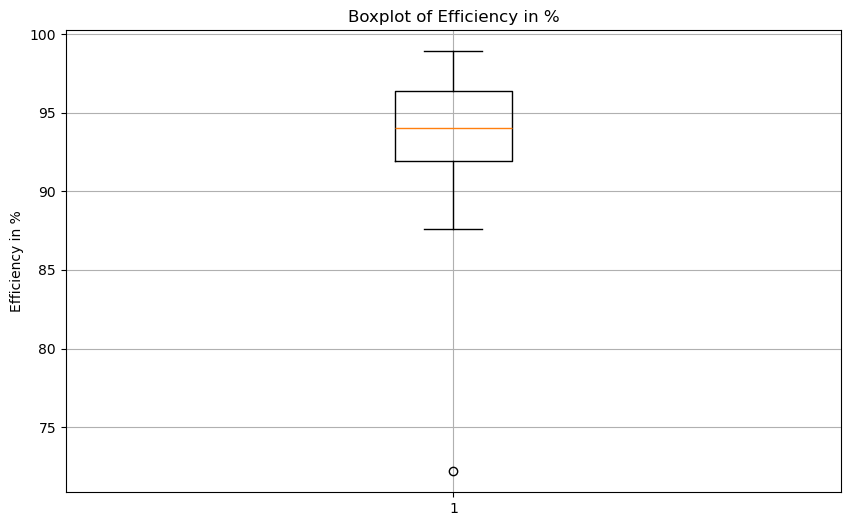

In [22]:
# Selecting only numeric columns for the boxplot
numeric_columns = pharmacological_data.select_dtypes(include='number').columns

# Creating boxplots for each numeric column to visualize outliers
for col in numeric_columns:
    plt.figure(figsize=(10, 6))
    plt.boxplot(pharmacological_data[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

### 4- topological_data

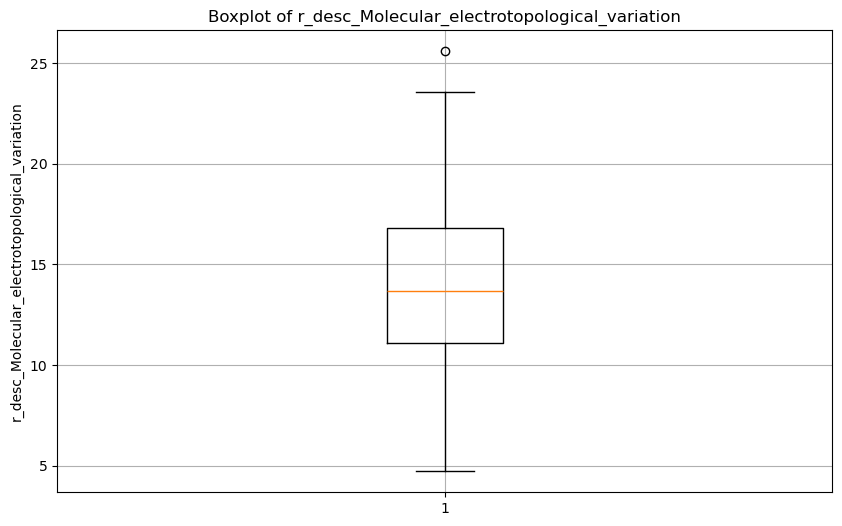

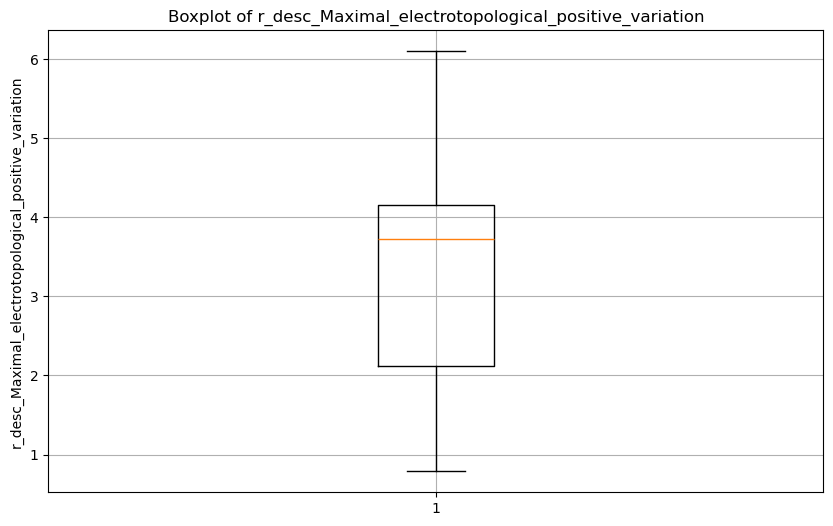

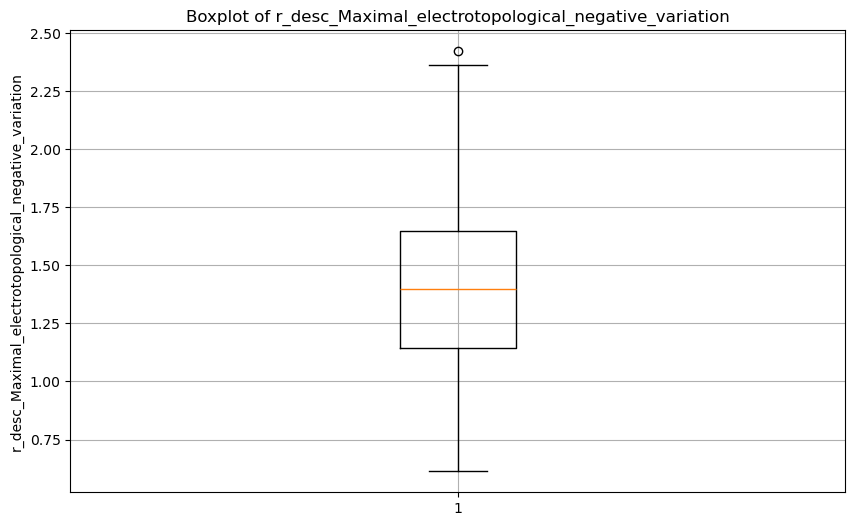

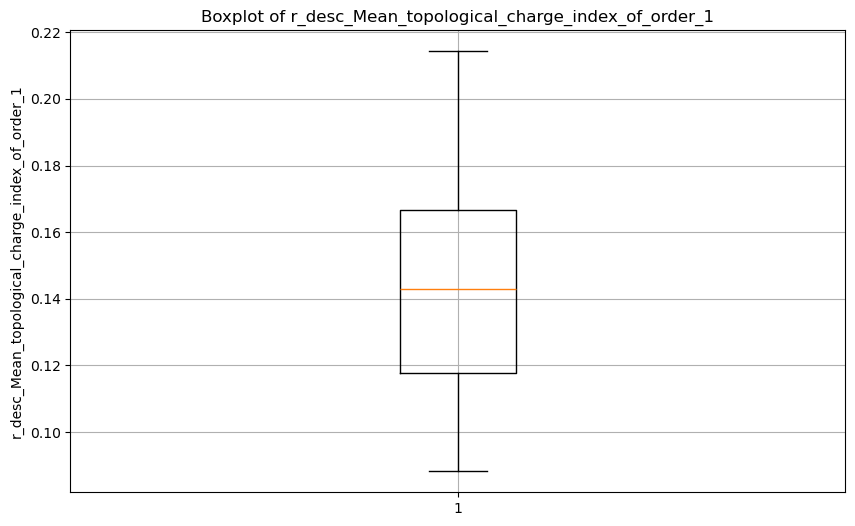

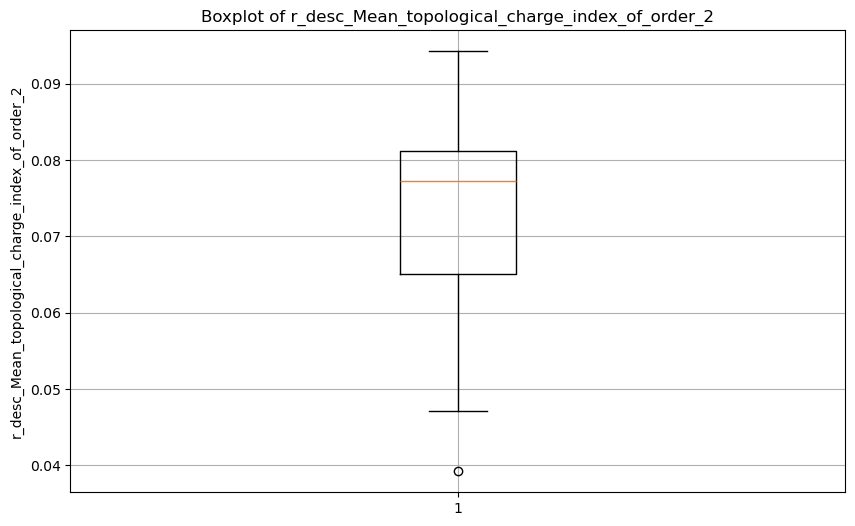

...

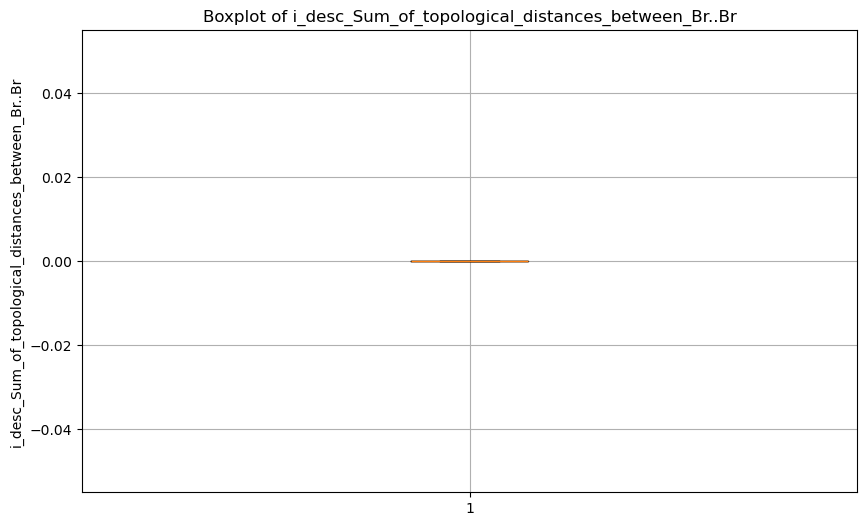

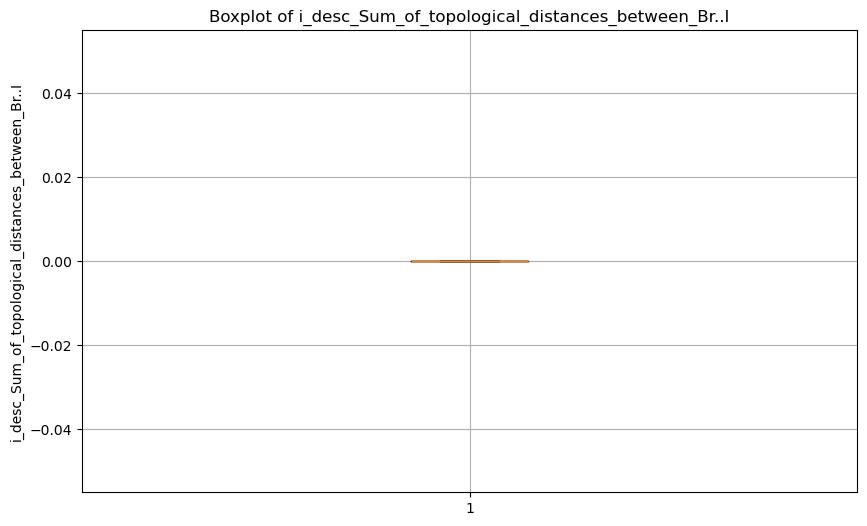

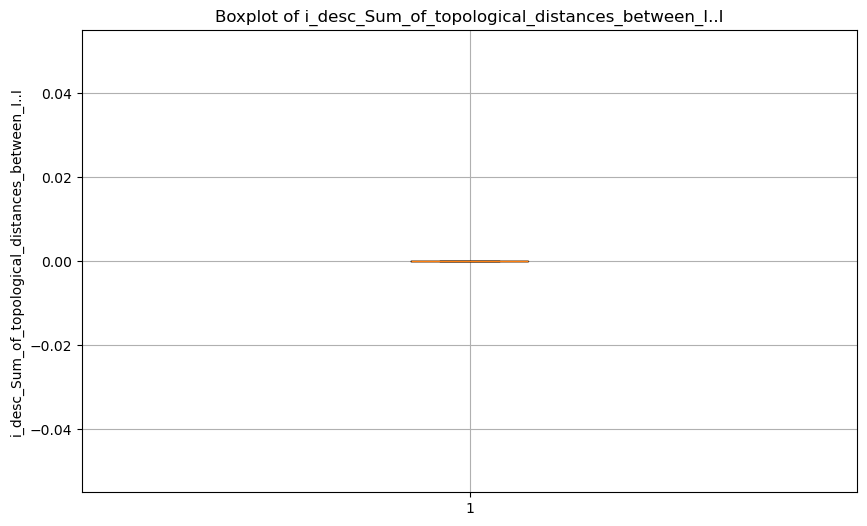

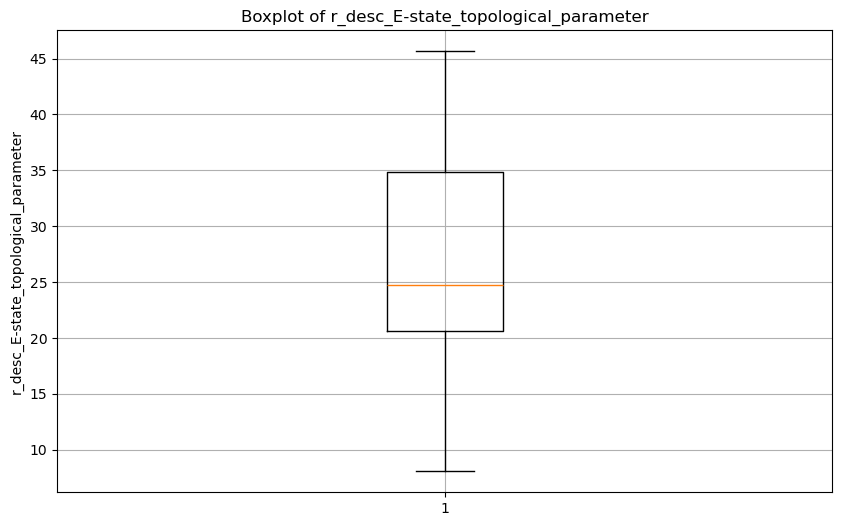

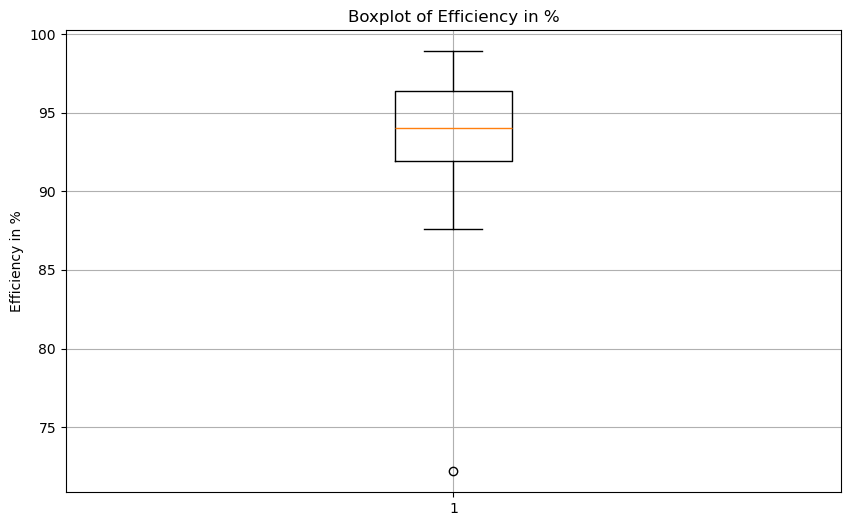

In [82]:
# Selecting only numeric columns for the boxplot
numeric_columns = topological_data.select_dtypes(include='number').columns

# Creating boxplots for each numeric column to visualize outliers
for col in numeric_columns:
    plt.figure(figsize=(10, 6))
    plt.boxplot(topological_data[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

### 5-mopac_quantum_data

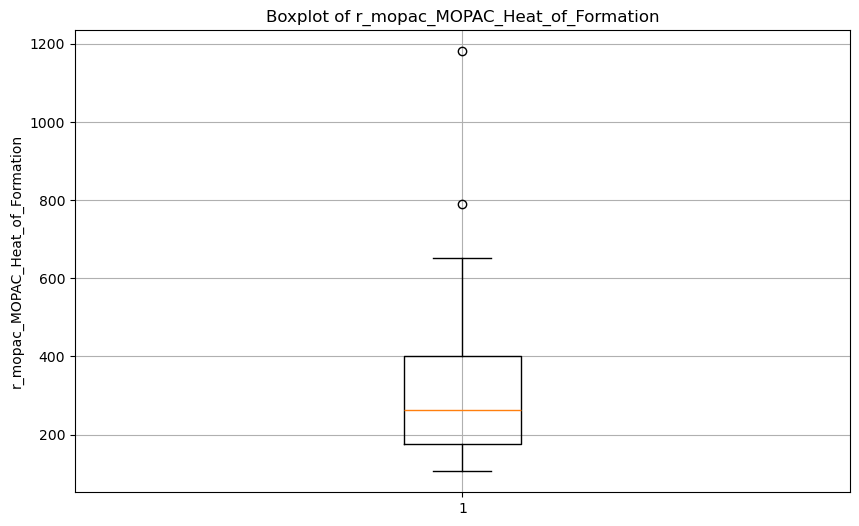

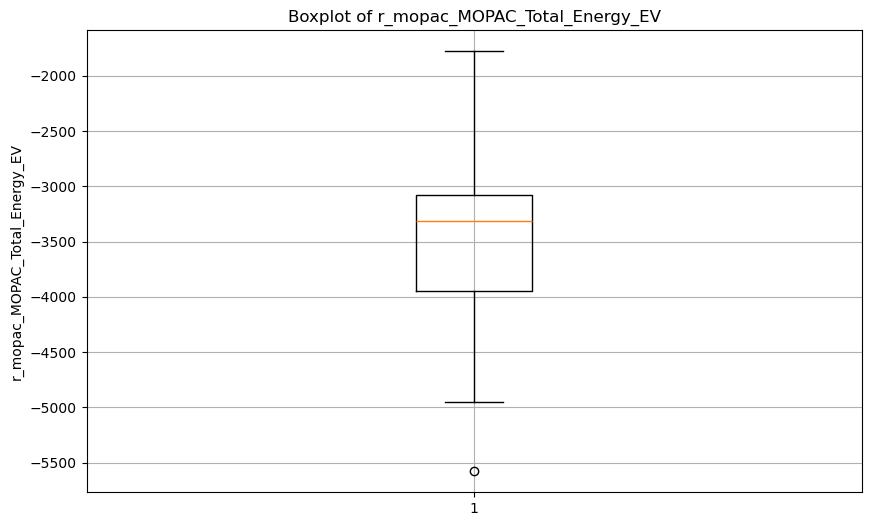

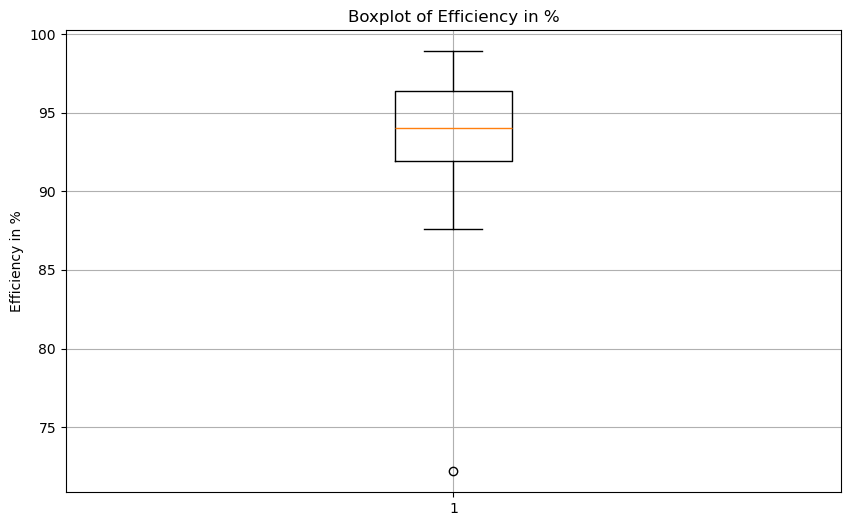

In [83]:
# Selecting only numeric columns for the boxplot
numeric_columns = mopac_quantum_data.select_dtypes(include='number').columns

# Creating boxplots for each numeric column to visualize outliers
for col in numeric_columns:
    plt.figure(figsize=(10, 6))
    plt.boxplot(mopac_quantum_data[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

## Normalization 

In [17]:
from sklearn.preprocessing import MinMaxScaler

In [18]:
# Define a function to normalize each dataset
def normalize_data(data):
    scaler = MinMaxScaler()
    # Extract numeric columns and scale them
    numeric_columns = data.select_dtypes(include='number').columns
    scaled_data = data.copy()
    scaled_data[numeric_columns] = scaler.fit_transform(data[numeric_columns])
    return scaled_data

In [19]:
# Apply Min-Max Scaling to each dataset
jaguar_data_normalized = normalize_data(jaguar_data)
pharmacological_data_normalized = normalize_data(pharmacological_data)
topological_data_normalized = normalize_data(topological_data)
mopac_quantum_data_normalized = normalize_data(mopac_quantum_data)
physico_chemical_data_normalized = normalize_data(physico_chemical_data)

In [20]:
jaguar_data_normalized

,Title,r_j_SCF_Energy_Hartree,r_j_Gas_Phase_Energy_Hartree,r_j_One_Electron_Energy_Hartree,r_j_Two-electron_Energy_Hartree,r_j_Total_Electronic_Energy_Hartree,r_j_Nuclear_Repulsion_Energy_Hartree,r_j_Alpha_HOMO_Energy_Hartree,r_j_Beta_HOMO_Energy_Hartree,r_j_Alpha_LUMO_Energy_Hartree,...,r_j_Dipole_Component_Y_(esp)_Debye,r_j_Dipole_Component_Z_(esp)_Debye,r_j_s2_Spin,r_j_sz2_Spin,r_j_Rotational_constants_of_molecule_0,r_j_Rotational_constants_of_molecule_1,r_j_Rotational_constants_of_molecule_2,i_j_symmetry_number_for_molecule,r_j_HOMO-LUMO_Gap_Hartree,Efficiency in %
0,H02,0.721267,0.721267,0.609212,0.421452,0.628942,0.424676,0.673355,0.673355,0.639610,...,0.783362,0.316197,0.0,0.0,0.075911,0.189257,0.184384,0.0,0.550789,0.700375
1,H04,0.953817,0.953817,0.921560,0.086407,0.926687,0.093915,0.373615,0.373615,0.378246,...,0.399070,0.973247,0.0,0.0,0.319860,0.680193,0.542937,0.0,0.609866,0.928839
2,H06,0.161868,0.161868,0.426689,0.507842,0.384567,0.281201,0.644812,0.644812,0.623672,...,0.824013,0.394767,0.0,0.0,0.189752,0.285628,0.274961,0.0,0.597207,0.895131
3,H08,0.149969,0.149969,0.417338,0.516224,0.374593,0.287654,0.698140,0.698140,0.621555,...,0.801969,0.000000,0.0,0.0,0.186772,0.083482,0.117992,0.0,0.365116,0.913858
4,H09,0.000000,0.000000,0.000000,1.000000,0.000000,0.864346,0.513441,0.513441,0.426282,...,0.849689,0.395197,0.0,0.0,0.008288,0.009229,0.000300,0.0,0.245554,0.928839
5,H11,0.912819,0.912819,0.839758,0.178322,0.851391,0.197614,0.368653,0.368653,0.397778,...,0.445736,0.647275,0.0,0.0,0.245668,0.385390,0.373768,0.0,0.719582,0.728464
6,H12,0.918822,0.918822,0.846267,0.171549,0.857730,0.191758,0.372627,0.372627,0.397139,...,0.496028,0.622801,0.0,0.0,0.293544,0.308212,0.311223,0.0,0.700090,0.898502
7,H13,0.876389,0.876389,0.749412,0.282395,0.769877,0.318833,0.439830,0.439830,0.451700,...,0.533297,0.620215,0.0,0.0,0.205768,0.081070,0.120375,0.0,0.668442,0.805243
8,H14,0.882795,0.882795,0.776981,0.251672,0.795417,0.275213,0.763224,0.763224,0.620012,...,0.901001,0.388563,0.0,0.0,0.244093,0.114588,0.141886,0.0,0.086607,0.823970
9,H15,0.929950,0.929950,0.870823,0.141681,0.878869,0.162215,0.135779,0.135779,0.194348,...,0.000000,1.000000,0.0,0.0,0.295702,0.260644,0.270583,0.0,0.763790,1.000000


## Distribution

In [21]:
import seaborn as sns

In [22]:
datasets = {
    "Jaguar Data": jaguar_data_normalized,
    "Pharmacological Data": pharmacological_data_normalized,
    "Topological Data": topological_data_normalized,
    "MOPAC Quantum Data": mopac_quantum_data_normalized,
    "Physico-Chemical Data": physico_chemical_data_normalized
}

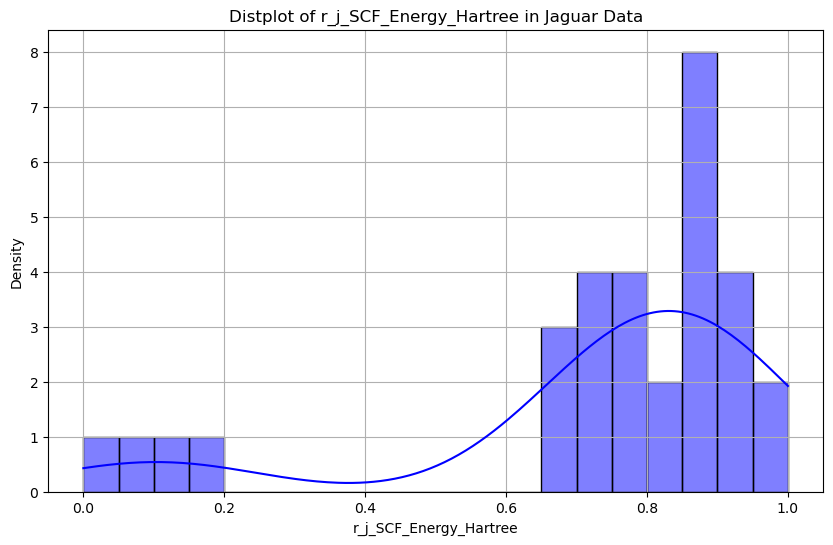

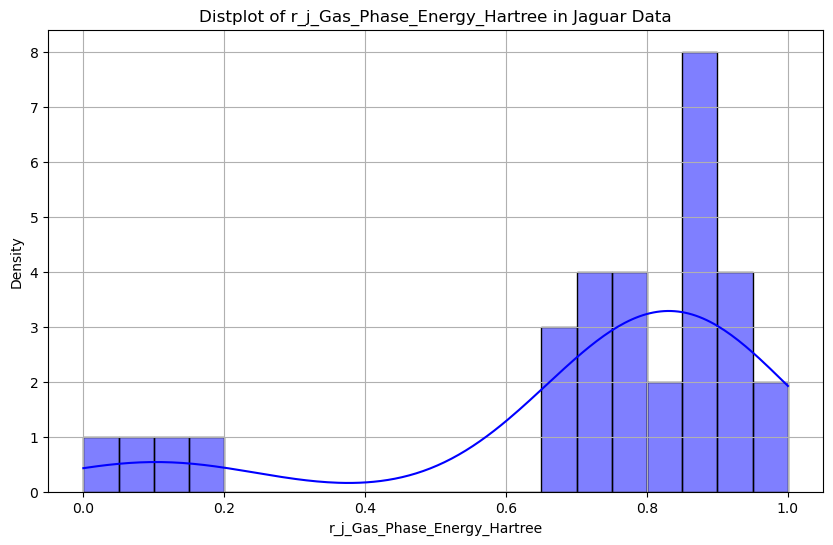

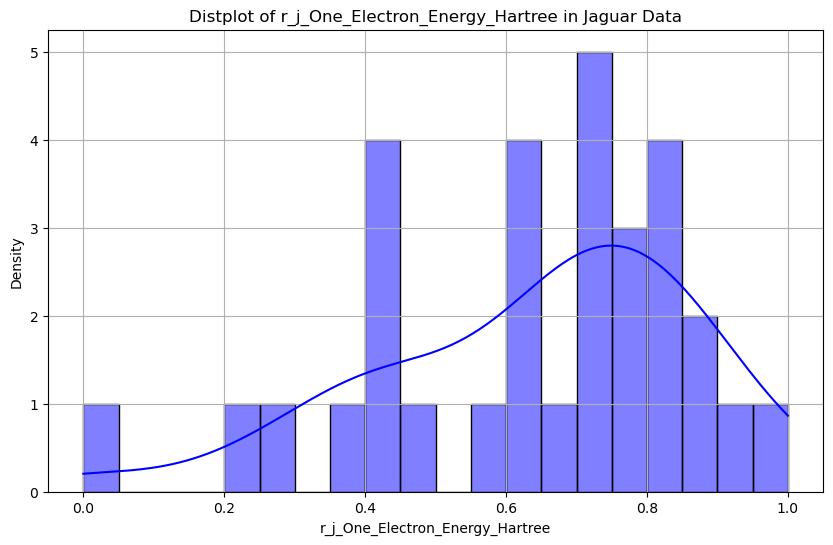

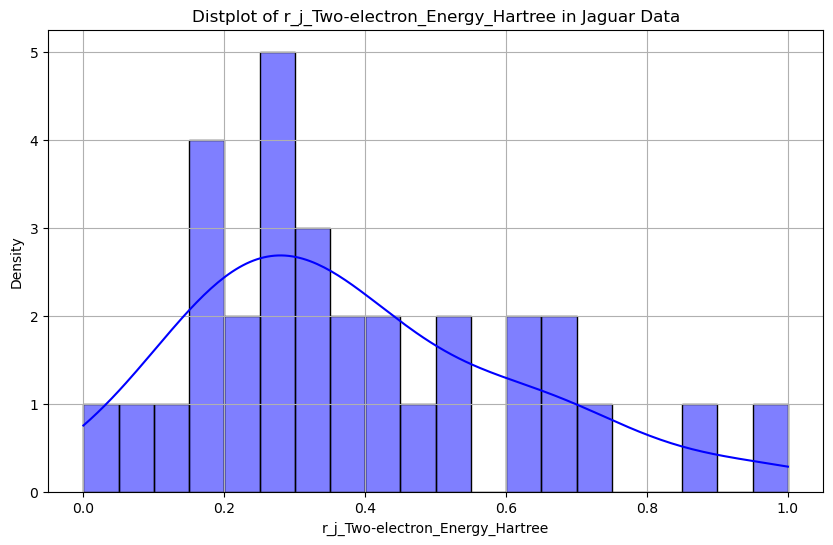

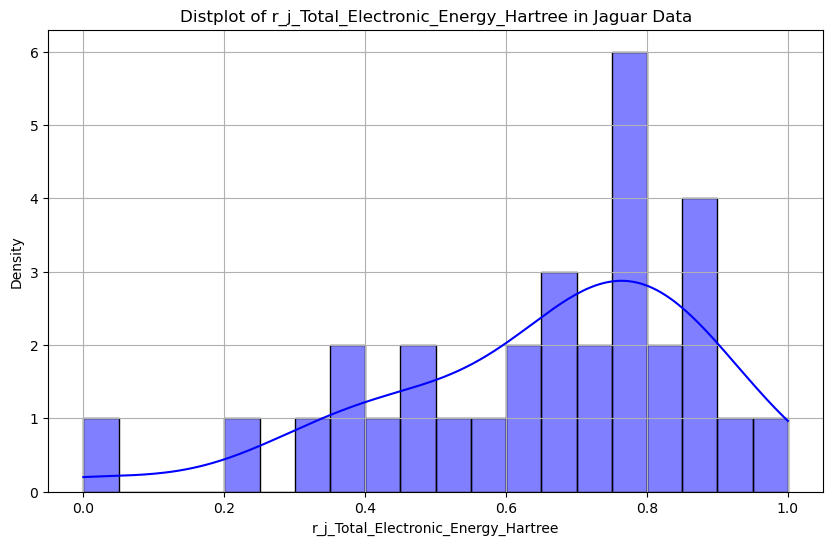

...

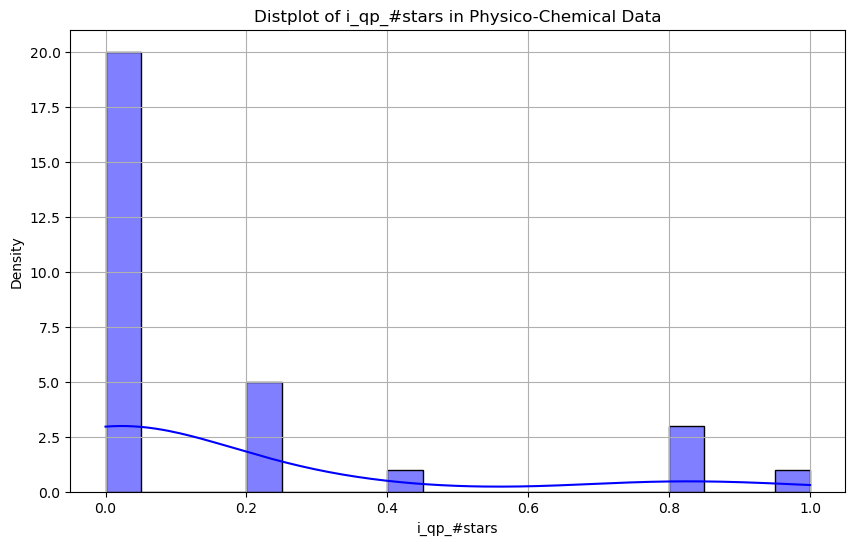

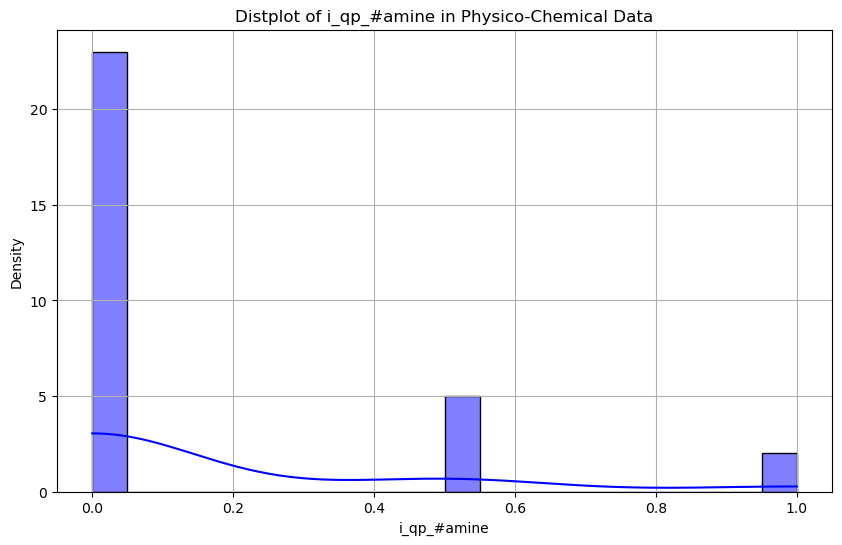

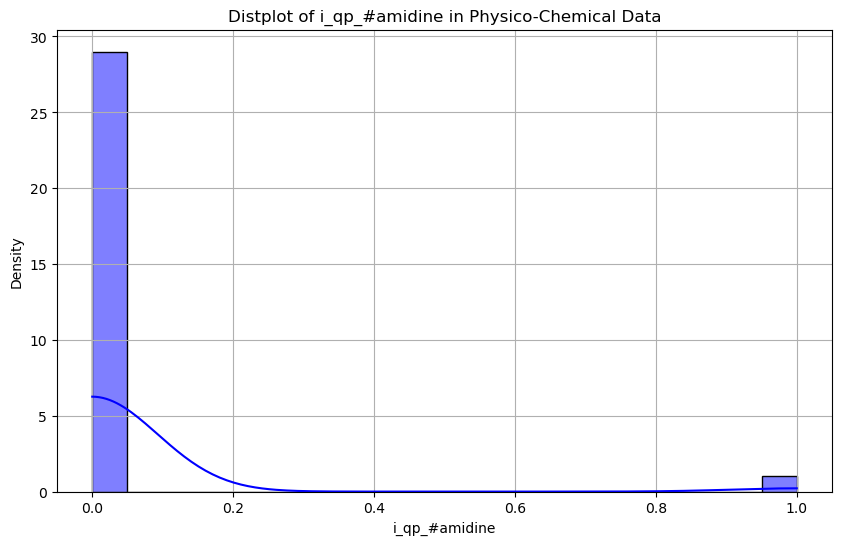

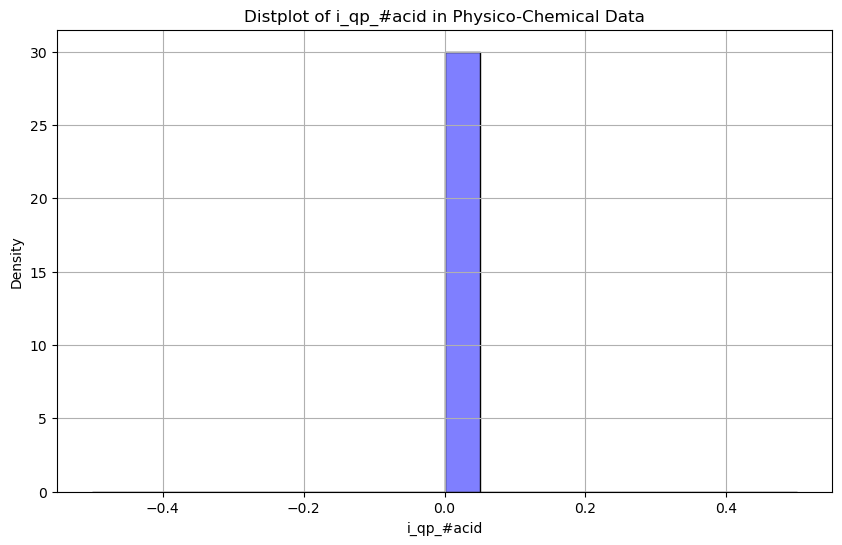

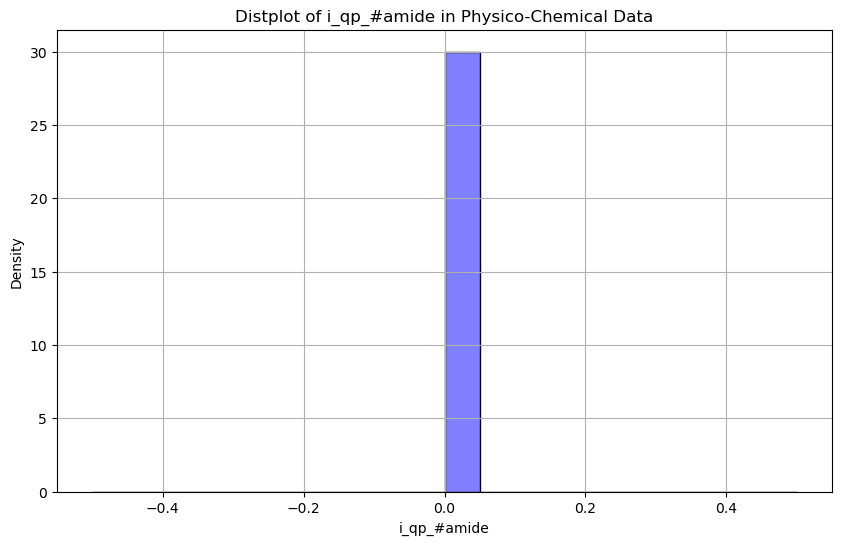

In [23]:
# Redefining subset_columns since it was lost in the previous context
subset_columns = {
    "Jaguar Data": jaguar_data_normalized.select_dtypes(include='number').columns[:5],
    "Pharmacological Data": pharmacological_data_normalized.select_dtypes(include='number').columns[:5],
    "Topological Data": topological_data_normalized.select_dtypes(include='number').columns[:5],
    "MOPAC Quantum Data": mopac_quantum_data_normalized.select_dtypes(include='number').columns[:5],
    "Physico-Chemical Data": physico_chemical_data_normalized.select_dtypes(include='number').columns[:5]
}

# Generating distplots for the subset of columns in each dataset
for dataset_name, columns in subset_columns.items():
    for col in columns:
        plt.figure(figsize=(10, 6))
        sns.histplot(datasets[dataset_name][col].dropna(), kde=True, bins=20, color='blue')
        plt.title(f'Distplot of {col} in {dataset_name}')
        plt.xlabel(col)
        plt.ylabel('Density')
        plt.grid(True)
        plt.show()


In [24]:
num_c_j = jaguar_data.select_dtypes(include=['float64','int64'])
correlation_matrix_jaguar = num_c_j.corr()

In [25]:
correlation_with_jag = num_c_j.corr()['Efficiency in %'].sort_values(ascending=False)

# Display the top 10 features with the highest correlation with the target
correlation_with_jag.head(10)

Efficiency in %                            1.000000
r_j_Dipole_Component_Z_(qm)_Debye          0.292565
r_j_Dipole_Component_Z_(esp)_Debye         0.292322
r_j_Two-electron_Energy_Hartree            0.291477
i_j_Number_of_canonical_orbitals           0.262001
r_j_Nuclear_Repulsion_Energy_Hartree       0.245166
r_j_Dipole_Component_Y_(qm)_Debye          0.183781
r_j_Dipole_Component_Y_(esp)_Debye         0.182947
r_j_Dipole_Moment_Magnitude_(esp)_Debye    0.077497
r_j_Dipole_Moment_Magnitude_(qm)_Debye     0.076936
Name: Efficiency in %, dtype: float64

In [26]:
top_10_features_jaguare = correlation_with_jag.head(10).index

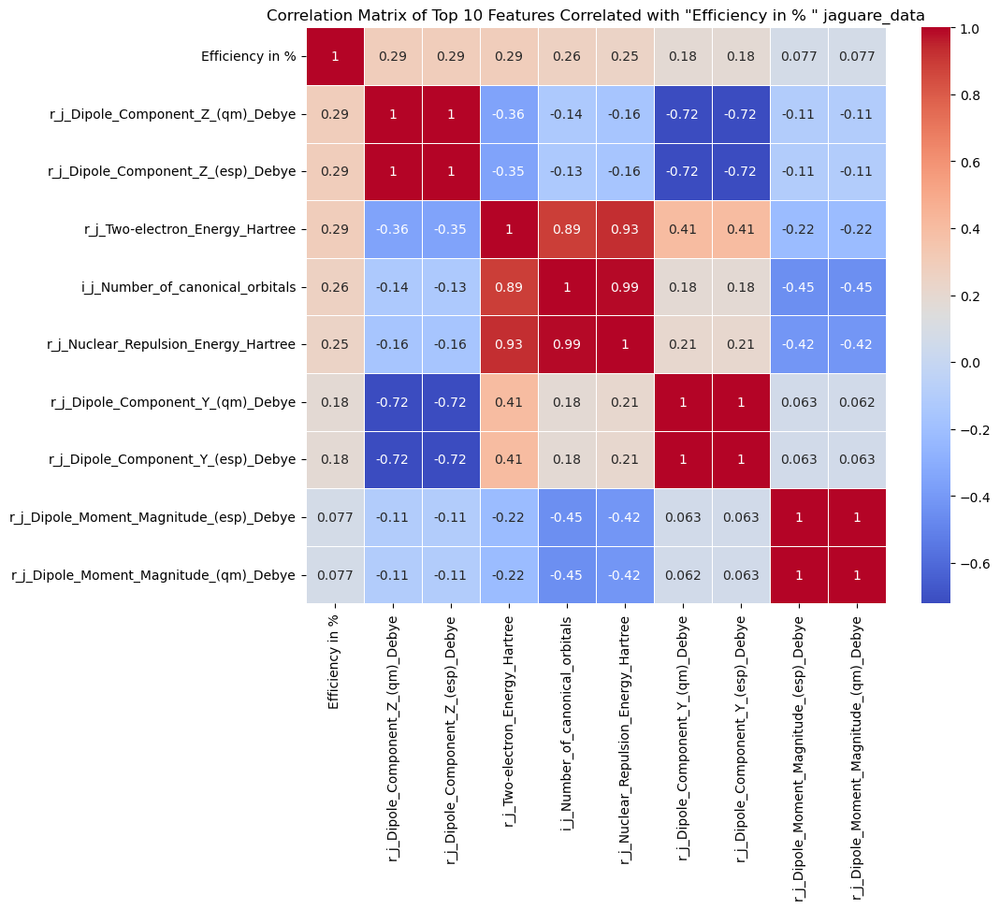

In [27]:
# Filter the correlation matrix for the top 10 correlated features
top_10_corr_matrix = correlation_matrix_jaguar.loc[top_10_features_jaguare, top_10_features_jaguare]

# Plot the correlation matrix of the top 10 features
plt.figure(figsize=(10, 8))
sns.heatmap(top_10_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Top 10 Features Correlated with "Efficiency in % " jaguare_data')
plt.savefig('top_10_correlation_matrix_jaguare.png', dpi=300, bbox_inches='tight')

plt.show()

### 2.For pharmacological_data_normalized

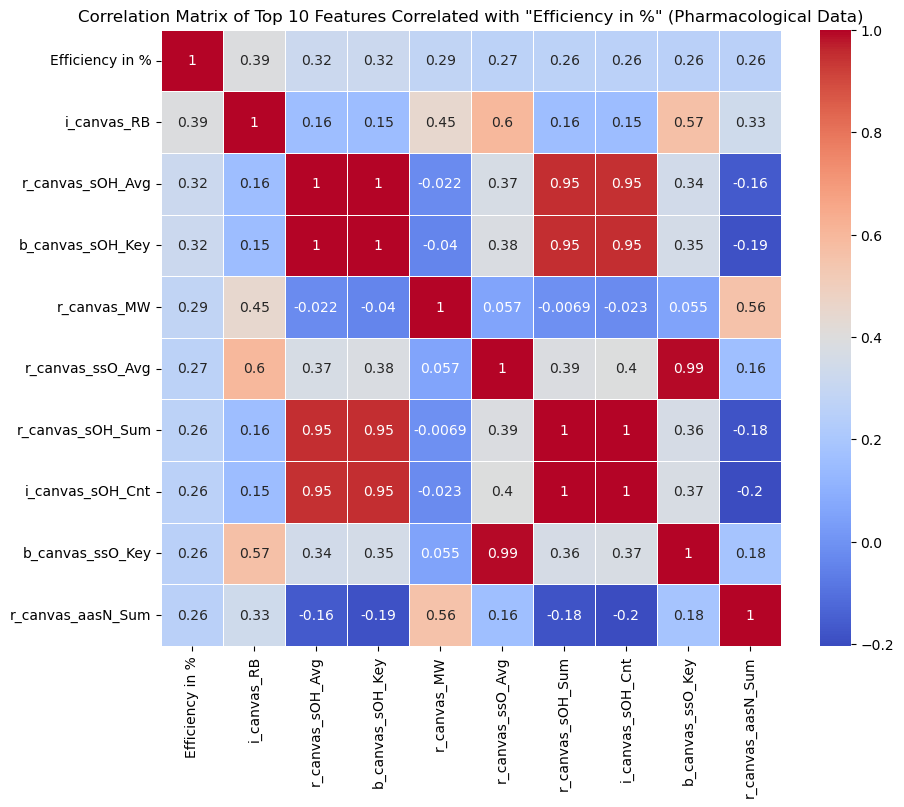

In [53]:
# Step 1: Select numerical columns from the dataset
num_c_pharma = pharmacological_data_normalized.select_dtypes(include=['float64', 'int64'])

# Step 2: Calculate the correlation matrix
correlation_matrix_pharma = num_c_pharma.corr()

# Step 3: Calculate the correlation of each feature with the target variable ('Efficiency in %')
correlation_with_pharma = num_c_pharma.corr()['Efficiency in %'].sort_values(ascending=False)

# Step 4: Get the top 10 features with the highest correlation
top_10_features_pharma = correlation_with_pharma.head(10).index

# Step 5: Filter the correlation matrix for the top 10 correlated features
top_10_corr_matrix_pharma = correlation_matrix_pharma.loc[top_10_features_pharma, top_10_features_pharma]

# Step 6: Plot the correlation matrix for the top 10 features
plt.figure(figsize=(10, 8))
sns.heatmap(top_10_corr_matrix_pharma, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Top 10 Features Correlated with "Efficiency in %" (Pharmacological Data)')
plt.savefig('top_10_correlation_matrix_pharma.png', dpi=300, bbox_inches='tight')

plt.show()

### 3. For topological_data_normalized

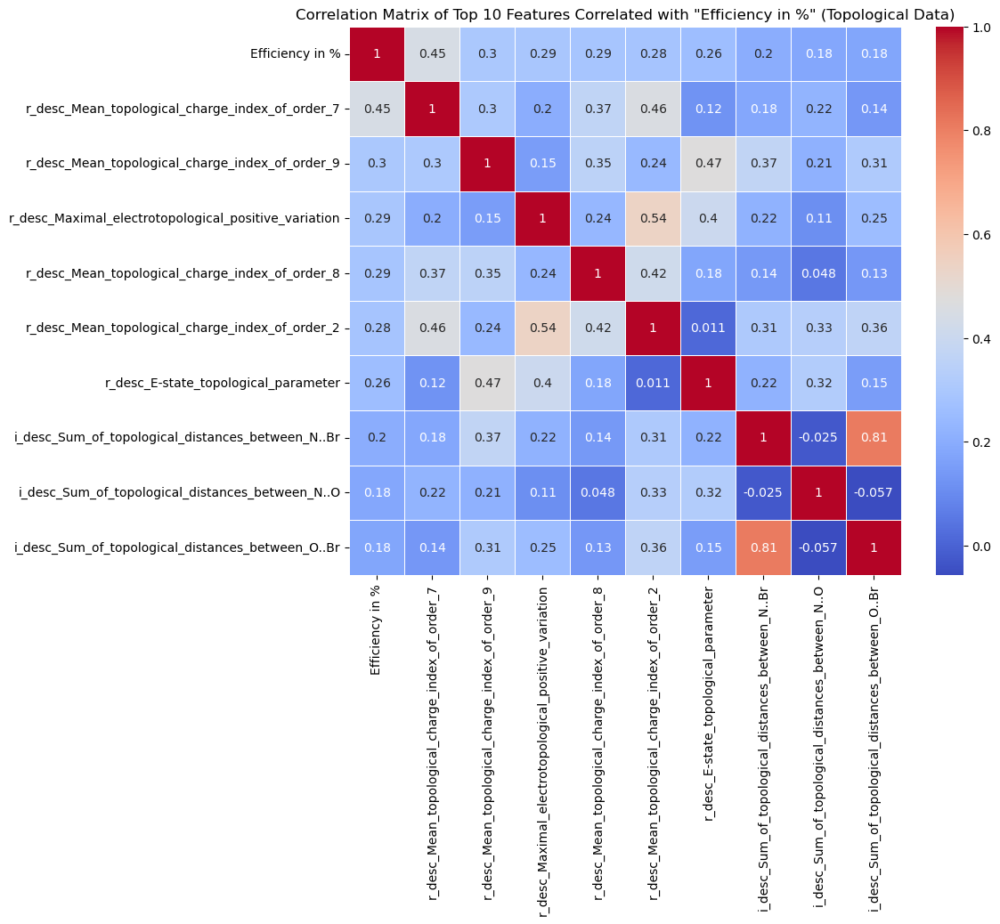

In [54]:
# Step 1: Select numerical columns
num_c_topo = topological_data_normalized.select_dtypes(include=['float64', 'int64'])

# Step 2: Calculate the correlation matrix
correlation_matrix_topo = num_c_topo.corr()

# Step 3: Correlation with the target variable
correlation_with_topo = num_c_topo.corr()['Efficiency in %'].sort_values(ascending=False)

# Step 4: Get the top 10 features
top_10_features_topo = correlation_with_topo.head(10).index

# Step 5: Filter the correlation matrix
top_10_corr_matrix_topo = correlation_matrix_topo.loc[top_10_features_topo, top_10_features_topo]

# Step 6: Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(top_10_corr_matrix_topo, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Top 10 Features Correlated with "Efficiency in %" (Topological Data)')
plt.savefig('top_10_correlation_matrix_topo.png', dpi=300, bbox_inches='tight')

plt.show()

### 4. For mopac_quantum_data_normalized

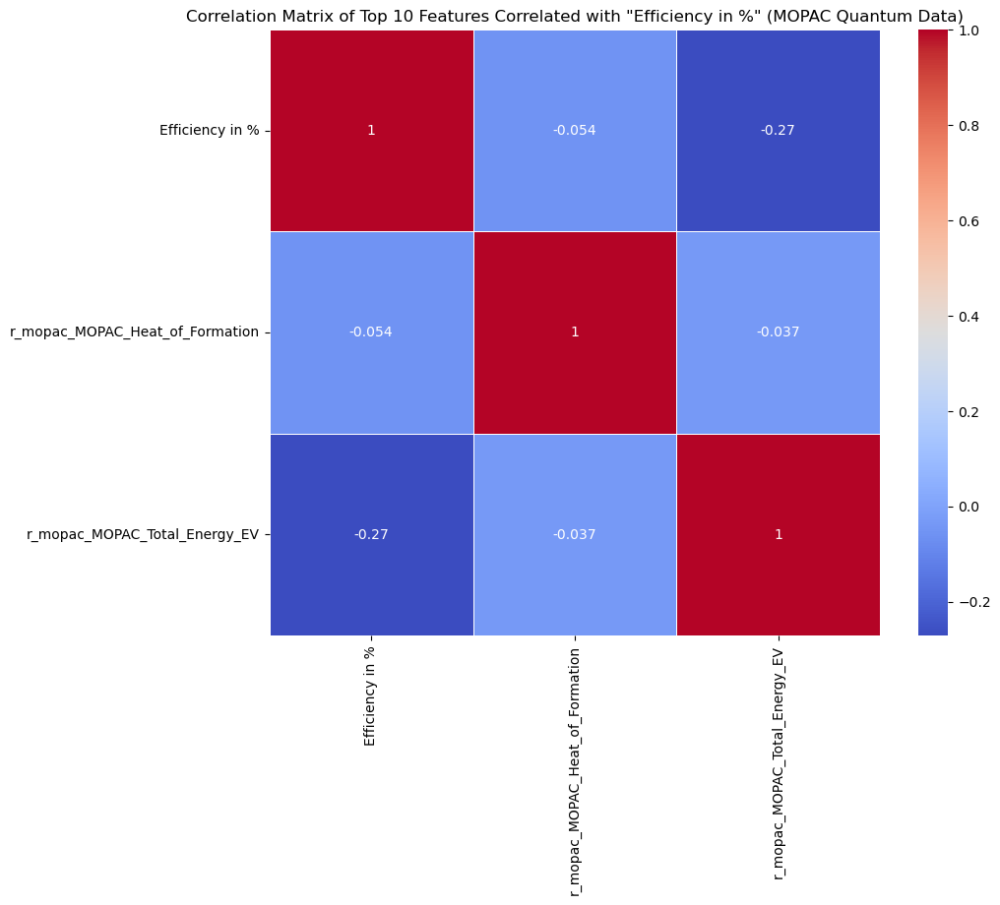

In [55]:
# Step 1: Select numerical columns
num_c_mopac = mopac_quantum_data_normalized.select_dtypes(include=['float64', 'int64'])

# Step 2: Calculate the correlation matrix
correlation_matrix_mopac = num_c_mopac.corr()

# Step 3: Correlation with the target variable
correlation_with_mopac = num_c_mopac.corr()['Efficiency in %'].sort_values(ascending=False)

# Step 4: Get the top 10 features
top_10_features_mopac = correlation_with_mopac.head(10).index

# Step 5: Filter the correlation matrix
top_10_corr_matrix_mopac = correlation_matrix_mopac.loc[top_10_features_mopac, top_10_features_mopac]

# Step 6: Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(top_10_corr_matrix_mopac, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Top 10 Features Correlated with "Efficiency in %" (MOPAC Quantum Data)')
plt.savefig('top_10_correlation_matrix_mopac.png', dpi=300, bbox_inches='tight')

plt.show()

### 5. For physico_chemical_data_normalized

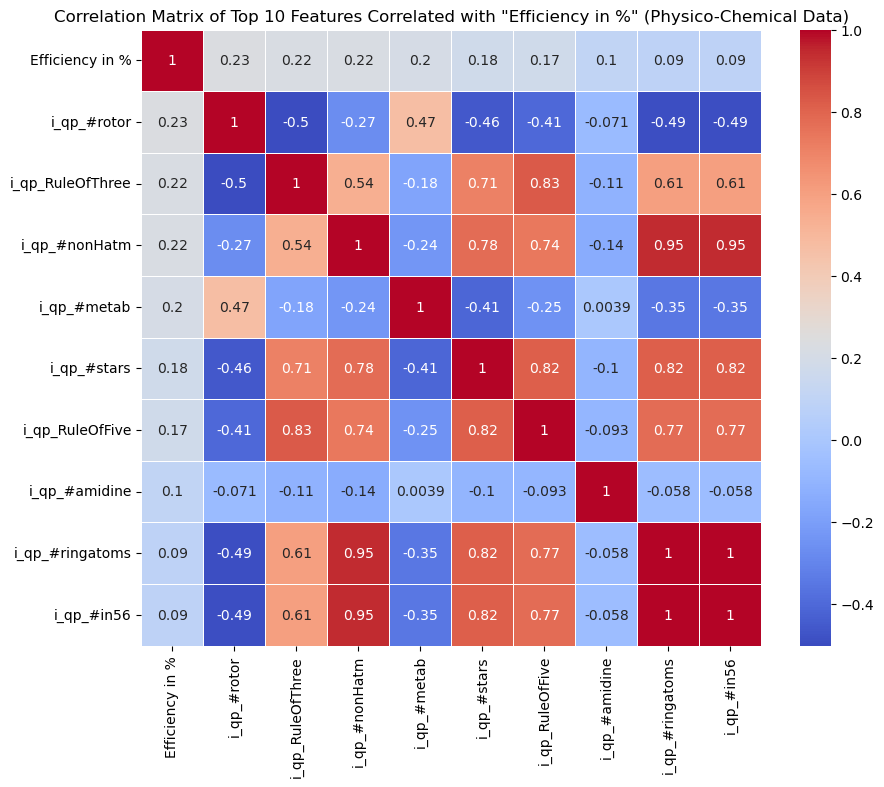

In [56]:
# Step 1: Select numerical columns
num_c_physico = physico_chemical_data_normalized.select_dtypes(include=['float64', 'int64'])

# Step 2: Calculate the correlation matrix
correlation_matrix_physico = num_c_physico.corr()

# Step 3: Correlation with the target variable
correlation_with_physico = num_c_physico.corr()['Efficiency in %'].sort_values(ascending=False)

# Step 4: Get the top 10 features
top_10_features_physico = correlation_with_physico.head(10).index

# Step 5: Filter the correlation matrix
top_10_corr_matrix_physico = correlation_matrix_physico.loc[top_10_features_physico, top_10_features_physico]

# Step 6: Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(top_10_corr_matrix_physico, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Top 10 Features Correlated with "Efficiency in %" (Physico-Chemical Data)')
plt.savefig('top_10_correlation_matrix_physico.png', dpi=300, bbox_inches='tight')

plt.show()

In [39]:
jaguar_data_normalized.shape

(31, 29)

In [40]:
pharmacological_data_normalized.shape

(31, 367)

In [41]:
topological_data_normalized.shape

(31, 53)

In [43]:
physico_chemical_data_normalized.shape

(30, 20)

In [44]:
mopac_quantum_data_normalized.shape

(31, 4)

In [60]:
jaguar_data_normalized.to_excel('jaguar_data_normalized.xlsx')
pharmacological_data_normalized.to_excel('pharmacological_data_normalized.xlsx')
topological_data_normalized.to_excel('topological_data_normalized.xlsx')
physico_chemical_data_normalized.to_excel('physico_chemical_data_normalized.xlsx')
mopac_quantum_data_normalized.to_excel('mopac_quantum_data_normalized.xlsx')